In [1]:
%load_ext nb_black

<IPython.core.display.Javascript object>

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

from scipy.stats import pearsonr
from collections import Counter

<IPython.core.display.Javascript object>

# Exploratory Data Analyses - EDA - 209 data

### Reading the files and extracting relevant information:

In [3]:
plants = [
    "X",
    "H",
    "AS",
    "AG",
    "AW",
    "AZ",
    "W",
    "V",
    "AX",
    "L",
    "N",
    "AI",
    "AA",
    "P",
    "Q",
    "AP",
    "E",
    "AN",
    "AC",
    "K",
    "S",
    "U",
    "J",
    "AM",
    "Z",
]
xls_files = {}

for plant in plants:
    xls = pd.ExcelFile(
        f"../../../data/raw/209/EMBRAPII hubIC IACC_CIMENTO_{plant}.xlsx",
        engine="openpyxl",
    )
    xls_files[plant] = xls

<IPython.core.display.Javascript object>

In [4]:
for plant, xls in xls_files.items():
    print("Palnt: ", plant, xls.sheet_names)

Palnt:  X ['INSTRUÇÕES', 'Clínquer', '78', '83', '19']
Palnt:  H ['INSTRUÇÕES', 'Clínquer', '119', '76', '87']
Palnt:  AS ['INSTRUÇÕES', 'Clínquer', '31', '63']
Palnt:  AG ['INSTRUÇÕES', 'Clínquer', '146', '115', '166']
Palnt:  AW ['INSTRUÇÕES', 'Clínquer', '88']
Palnt:  AZ ['INSTRUÇÕES', 'Clínquer', '4', '92', '70', '111', '156']
Palnt:  W ['INSTRUÇÕES', 'Clínquer', '140', '196', '163']
Palnt:  V ['INSTRUÇÕES', 'Clínquer', '93']
Palnt:  AX ['INSTRUÇÕES', 'Clínquer', '152', '108', '118']
Palnt:  L ['INSTRUÇÕES', 'Clínquer', '6', '39', '16']
Palnt:  N ['INSTRUÇÕES', 'Clínquer', '80', '66', '94']
Palnt:  AI ['INSTRUÇÕES', 'Clínquer', '79', '27', '120']
Palnt:  AA ['INSTRUÇÕES', 'Clínquer', '95', '110', '133', '145']
Palnt:  P ['INSTRUÇÕES', 'Clínquer', '175']
Palnt:  Q ['INSTRUÇÕES', 'Clínquer', '56', '32', '101', '143']
Palnt:  AP ['INSTRUÇÕES', 'Clínquer', '191', '189', '199', '41']
Palnt:  E ['INSTRUÇÕES', 'Clínquer', '121', '178']
Palnt:  AN ['INSTRUÇÕES', 'Clínquer', '112', '172']
P

<IPython.core.display.Javascript object>

In [5]:
cement_types_per_plant = []
CEMENT_TYPE_COLS = ["Tipo de cimento", "Classe de resistência"]
dataframes = []

for plant, xls in xls_files.items():
    for sheet_name in xls.sheet_names[2:]:
        df = pd.read_excel(xls_files[plant], sheet_name, header=[1, 2])

        if not df[CEMENT_TYPE_COLS].iloc[2:].isna().all().all():
            cement_type = (
                df[CEMENT_TYPE_COLS]
                .loc[2:]
                .astype(str)
                .sum(axis=1)
                .str.replace(" ", "")
                .str.replace("-", "")
                .str.replace("nan", "")
                .unique()
            )

        else:
            cement_type = (
                df[[("Obs.", "Unnamed: 8_level_1")]]
                .loc[2:]
                .astype(str)
                .sum(axis=1)
                .str.replace(" ", "")
                .str.replace("-", "")
                .unique()
            )

        cement_types_per_plant.append((plant, sheet_name, cement_type))
        dataframes.append(df)

<IPython.core.display.Javascript object>

In [6]:
cement_types_per_plant

[('X', '78', array(['CPIIF32'], dtype=object)),
 ('X', '83', array(['CPIIF40'], dtype=object)),
 ('X', '19', array(['CPIV32'], dtype=object)),
 ('H', '119', array(['CPI40'], dtype=object)),
 ('H', '76', array(['CPIIF32'], dtype=object)),
 ('H', '87', array(['CPIIF40'], dtype=object)),
 ('AS', '31', array(['CPIIZ32'], dtype=object)),
 ('AS', '63', array(['CPIIZ40'], dtype=object)),
 ('AG', '146', array(['CPIIZ32'], dtype=object)),
 ('AG', '115', array(['CPIVRS32'], dtype=object)),
 ('AG', '166', array(['CPVRSARI'], dtype=object)),
 ('AW', '88', array(['CPIV32'], dtype=object)),
 ('AZ', '4', array(['CPIIE40'], dtype=object)),
 ('AZ', '92', array(['CPIIIRS32'], dtype=object)),
 ('AZ', '70', array(['CPIND'], dtype=object)),
 ('AZ', '111', array(['CPVARI'], dtype=object)),
 ('AZ', '156', array(['CPIIIRS40'], dtype=object)),
 ('W', '140', array(['CPIIF40'], dtype=object)),
 ('W', '196', array(['CPIIF32'], dtype=object)),
 ('W', '163', array(['CPVARI'], dtype=object)),
 ('V', '93', array(['CP

<IPython.core.display.Javascript object>

In [7]:
cements = []
for tup in cement_types_per_plant:
    cements.append(tup[2][0])
Counter(cements)

Counter({'CPIIF40': 12,
         'CPIIF32': 10,
         'CPIV32': 9,
         'CPVARI': 8,
         'CPIIZ32': 5,
         'CPIIE40': 5,
         'CPIIZ40': 4,
         'CPIIE32': 4,
         'CPIIIRS40': 3,
         'CPIIFFIBRO40': 3,
         'CPIVRS32': 2,
         'CPIIIRS32': 2,
         'CPIII40': 2,
         'CPI40': 1,
         'CPVRSARI': 1,
         'CPIND': 1,
         'CPINDCC': 1,
         'CPIS40': 1,
         'CPIII32': 1})

<IPython.core.display.Javascript object>

In [8]:
dataframes = []

for plant, xls in xls_files.items():
    for sheet_name in xls.sheet_names[2:]:
        df = pd.read_excel(xls_files[plant], sheet_name, header=[0, 1, 2])
        df["Unnamed: 0_level_0", "Unnamed: 0_level_1", "Unnamed: 0_level_2"] = plant
        dataframes.append(df.drop([0, 1], axis=0).reset_index(drop=True).copy())

<IPython.core.display.Javascript object>

In [9]:
df = pd.concat(dataframes, axis=0).reset_index(drop=True)

<IPython.core.display.Javascript object>

In [10]:
df["Dados iniciais"].infer_objects().info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31110 entries, 0 to 31109
Data columns (total 8 columns):
 #   Column                                       Non-Null Count  Dtype         
---  ------                                       --------------  -----         
 0   (Cidade, Unnamed: 1_level_2)                 31110 non-null  object        
 1   (Data, Produção)                             31110 non-null  datetime64[ns]
 2   (Horário, Produção)                          31110 non-null  object        
 3   (Data, Medida)                               30151 non-null  datetime64[ns]
 4   (Horário, Medida)                            30151 non-null  object        
 5   (Tipo de cimento, Unnamed: 6_level_2)        31110 non-null  object        
 6   (Classe de resistência, Unnamed: 7_level_2)  29849 non-null  object        
 7   (Obs., Unnamed: 8_level_2)                   28185 non-null  object        
dtypes: datetime64[ns](2), object(6)
memory usage: 1.9+ MB


<IPython.core.display.Javascript object>

In [11]:
df["Materiais cimentícios suplementares"].infer_objects().info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31110 entries, 0 to 31109
Data columns (total 59 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   (Fíler calcário, CaO)              0 non-null      float64
 1   (Fíler calcário, SO2)              0 non-null      float64
 2   (Fíler calcário, K2O)              0 non-null      float64
 3   (Fíler calcário, MgO)              0 non-null      float64
 4   (Fíler calcário, Na2O)             0 non-null      float64
 5   (Fíler calcário, SiO2)             0 non-null      float64
 6   (Fíler calcário, Al2O3)            0 non-null      float64
 7   (Fíler calcário, Fe2O3)            0 non-null      float64
 8   (Fíler calcário, Perda ao fogo)    0 non-null      float64
 9   (Fíler calcário, Calcita)          0 non-null      float64
 10  (Fíler calcário, Dolomita)         0 non-null      float64
 11  (Fíler calcário, Quartzo)          0 non-null      flo

<IPython.core.display.Javascript object>

In [12]:
df["Cimento"]["Composição"].infer_objects().info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31110 entries, 0 to 31109
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Clínquer           0 non-null      float64
 1   Fíler calcário     0 non-null      float64
 2   Cinza volante      0 non-null      float64
 3   Escória            0 non-null      float64
 4   Argila calcinada   0 non-null      float64
 5   Sulfato de cálcio  3160 non-null   float64
 6   Obs.               0 non-null      float64
dtypes: float64(7)
memory usage: 1.7 MB


<IPython.core.display.Javascript object>

In [13]:
df["Cimento"]["Análise química"].infer_objects().info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31110 entries, 0 to 31109
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   CaO                29814 non-null  object 
 1   MgO                30283 non-null  object 
 2   Na2O               28752 non-null  object 
 3   Al2O3              29716 non-null  object 
 4   SiO2               29716 non-null  object 
 5   SO3                30815 non-null  object 
 6   K2O                29184 non-null  object 
 7   TiO2               6985 non-null   object 
 8   Fe2O3              29716 non-null  object 
 9   Perda ao fogo      30858 non-null  object 
 10  Resíduo insolúvel  29767 non-null  object 
 11  Obs.               0 non-null      float64
dtypes: float64(1), object(11)
memory usage: 2.8+ MB


<IPython.core.display.Javascript object>

In [14]:
df["Cimento"]["Análise mineralógica"].infer_objects().info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31110 entries, 0 to 31109
Data columns (total 23 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   C3S total          6414 non-null   object 
 1   C2S total          3694 non-null   object 
 2   C2S alpha          1621 non-null   object 
 3   C2S beta           1680 non-null   object 
 4   C2S gama           1621 non-null   object 
 5   C4AF               10923 non-null  object 
 6   C3A                8733 non-null   object 
 7   C3A cubic          9677 non-null   object 
 8   C3A orto           9677 non-null   object 
 9   CaO livre          12438 non-null  object 
 10  Portlandita        12426 non-null  object 
 11  Periclasio         10019 non-null  object 
 12  Arcanita           8075 non-null   object 
 13  Aphthalita         9428 non-null   object 
 14  Langbeinita        7477 non-null   object 
 15  Sulfato de cálcio  612 non-null    object 
 16  Bassanita          966

<IPython.core.display.Javascript object>

In [15]:
df["Cimento"].columns

MultiIndex([(          'Composição',          'Clínquer'),
            (          'Composição',    'Fíler calcário'),
            (          'Composição',     'Cinza volante'),
            (          'Composição',           'Escória'),
            (          'Composição',  'Argila calcinada'),
            (          'Composição', 'Sulfato de cálcio'),
            (          'Composição',              'Obs.'),
            (     'Análise química',               'CaO'),
            (     'Análise química',               'MgO'),
            (     'Análise química',              'Na2O'),
            (     'Análise química',             'Al2O3'),
            (     'Análise química',              'SiO2'),
            (     'Análise química',               'SO3'),
            (     'Análise química',               'K2O'),
            (     'Análise química',              'TiO2'),
            (     'Análise química',             'Fe2O3'),
            (     'Análise química',     'Perda ao fogo'

<IPython.core.display.Javascript object>

In [16]:
df["Característias físicas do cimento"].infer_objects().info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31110 entries, 0 to 31109
Data columns (total 6 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   (Unnamed: 136_level_1, Blaine)            30962 non-null  object 
 1   (Unnamed: 137_level_1, #200)              30606 non-null  object 
 2   (Unnamed: 138_level_1, #325)              27544 non-null  object 
 3   (Unnamed: 139_level_1, #400)              12778 non-null  object 
 4   (Unnamed: 140_level_1, Massa específica)  0 non-null      float64
 5   (Unnamed: 141_level_1, Obs.)              0 non-null      float64
dtypes: float64(2), object(4)
memory usage: 1.4+ MB


<IPython.core.display.Javascript object>

In [17]:
df["Propriedades do cimento"].infer_objects().info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31110 entries, 0 to 31109
Data columns (total 7 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   (Tempo de pega, Inicio)           28329 non-null  object 
 1   (Tempo de pega, Fim)              30869 non-null  object 
 2   (Resistência à compressão, 1 d)   3014 non-null   float64
 3   (Resistência à compressão, 3 d)   30988 non-null  object 
 4   (Resistência à compressão, 7 d)   30982 non-null  object 
 5   (Resistência à compressão, 28 d)  30910 non-null  object 
 6   (Obs., Unnamed: 148_level_2)      2 non-null      object 
dtypes: float64(1), object(6)
memory usage: 1.7+ MB


<IPython.core.display.Javascript object>

In [18]:
def convert_to_float(value):
    try:
        # If it's a string enclosed in single quotes, remove quotes and replace comma with dot
        if isinstance(value, str):
            return float(value.replace(",", "."))
        else:
            return float(value)
    except ValueError as e:
        print(e)
        return float("nan")

<IPython.core.display.Javascript object>

In [19]:
df = pd.concat(
    [
        df["Unnamed: 0_level_0", "Unnamed: 0_level_1", "Unnamed: 0_level_2"],
        df["Dados iniciais"],
        df["Cimento"]["Composição"].rename(
            {"Sulfato de cálcio": "Sulfato de cálcio (composição)"}, axis=1
        ),
        df["Cimento"]["Análise mineralógica"],
        df["Cimento"]["Análise química"],
        df["Característias físicas do cimento"],
        df["Propriedades do cimento"],
    ],
    axis=1,
)

<IPython.core.display.Javascript object>

In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31110 entries, 0 to 31109
Data columns (total 64 columns):
 #   Column                                                        Non-Null Count  Dtype  
---  ------                                                        --------------  -----  
 0   (Unnamed: 0_level_0, Unnamed: 0_level_1, Unnamed: 0_level_2)  31110 non-null  object 
 1   (Cidade, Unnamed: 1_level_2)                                  31110 non-null  object 
 2   (Data, Produção)                                              31110 non-null  object 
 3   (Horário, Produção)                                           31110 non-null  object 
 4   (Data, Medida)                                                30151 non-null  object 
 5   (Horário, Medida)                                             30151 non-null  object 
 6   (Tipo de cimento, Unnamed: 6_level_2)                         31110 non-null  object 
 7   (Classe de resistência, Unnamed: 7_level_2)                   29849

<IPython.core.display.Javascript object>

In [21]:
COLUMNS_TO_DROP = [
    ("Data", "Medida"),
    ("Horário", "Produção"),
    ("Horário", "Medida"),
    ("Obs.", "Unnamed: 148_level_2"),
    ("Tipo de cimento", "Unnamed: 6_level_2"),
    ("Classe de resistência", "Unnamed: 7_level_2"),
    ("Obs.", "Unnamed: 8_level_2"),
    "Obs.",
    ("Obs.", "Unnamed: 148_level_2"),
    ("Unnamed: 141_level_1", "Obs."),
    # ("Unnamed: 139_level_1", "#400"),
]

COLUMNS_TO_RENAME = {
    ("Unnamed: 0_level_0", "Unnamed: 0_level_1", "Unnamed: 0_level_2"): "Plant",
    ("Cidade", "Unnamed: 1_level_2"): "City",
    ("Data", "Produção"): "Date",  # Arrumar!
    ("Unnamed: 136_level_1", "Blaine"): "Blaine",
    ("Unnamed: 137_level_1", "#200"): "#200",
    ("Unnamed: 138_level_1", "#325"): "#325",
    ("Unnamed: 139_level_1", "#400"): "#400",
    ("Unnamed: 140_level_1", "Massa específica"): "Specific Gravity",
    ("Tempo de pega", "Inicio"): "Initial setting time",
    ("Tempo de pega", "Fim"): "Final setting time",
    ("Resistência à compressão", "1 d"): "CS1",
    ("Resistência à compressão", "3 d"): "CS3",
    ("Resistência à compressão", "7 d"): "CS7",
    ("Resistência à compressão", "28 d"): "CS28",
    "Perda ao fogo": "Loss on Ignition",
    "Resíduo insolúvel": "Insoluble Residue",
    "Clínquer": "Clinker",
    "Fíler calcário": "Calcareous filler",
    "Cinza volante": "Fly ash",
    "Escória": "Slag",
    "Argila calcinada": "Calcined clay",
    "Sulfato de cálcio": "Calcium sulfate",
    "C3S total": "Total C3S",
    "C2S total": "Total C2S",
    "C2S alpha": "Alpha C2S",
    "C2S beta": "Beta C2S",
    "C2S gama": "Gamma C2S",
    "C4AF": "C4AF",
    "C3A": "C3A",
    "C3A cubic": "Cubic C3A",
    "C3A orto": "Orthorhombic C3A",
    "CaO livre": "Free CaO",
    "Portlandita": "Portlandite",
    "Periclasio": "Periclase",
    "Arcanita": "Arcanite",
    "Aphthalita": "Aphthitalite",
    "Langbeinita": "Langbeinite",
    "Bassanita": "Bassanite",
    "Anidrita": "Anhydrite",
    "Calcita": "Calcite",
    "Dolomita": "Dolomite",
    "Quartzo": "Quartz",
    "Muscovita": "Muscovite",
    "Sulfato de cálcio (composição)": "Calcium sulfate (composition)",
}

# Single variable for the Cement Type
df["Cement_Type"] = (
    df[
        [
            ("Tipo de cimento", "Unnamed: 6_level_2"),
            ("Classe de resistência", "Unnamed: 7_level_2"),
            ("Obs.", "Unnamed: 8_level_2"),
        ]
    ]
    .fillna("")
    .astype(str)
    .sum(axis=1)
)

# # Preprocessing
df["Cement_Type"] = df["Cement_Type"].replace("Fibro", "Fibrocimento")


df = df.drop(COLUMNS_TO_DROP, axis=1).rename(COLUMNS_TO_RENAME, axis=1).copy()
df = df.drop([0]).reset_index(drop=True)
df = df.infer_objects()

<IPython.core.display.Javascript object>

In [22]:
def preprocess_numeric_cols(df, columns):
    for col in columns:
        df[col] = df[col].astype(str)  # Ensure string type for string operations
        df[col] = df[col].str.replace("#", "")  # Remove '#' characters
        df[col] = df[col].str.replace(",", ".")  # Replace ',' with '.' for decimals
    return df

<IPython.core.display.Javascript object>

In [23]:
NUMERIC_COLUMNS = [
    "Calcium sulfate (composition)",
    "Clinker",
    "Calcareous filler",
    "Fly ash",
    "Slag",
    "Calcined clay",
    "Calcium sulfate",
    "Total C3S",
    "Total C2S",
    "Alpha C2S",
    "Beta C2S",
    "Gamma C2S",
    "C4AF",
    "C3A",
    "Cubic C3A",
    "Orthorhombic C3A",
    "Free CaO",
    "Portlandite",
    "Periclase",
    "Arcanite",
    "Aphthitalite",
    "Langbeinite",
    "Bassanite",
    "Anhydrite",
    "Calcite",
    "Dolimita",
    "Quartz",
    "Muscovite",
    "CaO",
    "MgO",
    "Na2O",
    "Al2O3",
    "SiO2",
    "SO3",
    "K2O",
    "TiO2",
    "Fe2O3",
    "Loss on Ignition",
    "Insoluble Residue",
    "Blaine",
    "#200",
    "#325",
    "#400",
    "Specific Gravity",
    "Final setting time",
    "Initial setting time",
    "CS1",
    "CS3",
    "CS7",
    "CS28",
]

df = preprocess_numeric_cols(df, NUMERIC_COLUMNS)

# Preprocessing to fix numeric columns
df[NUMERIC_COLUMNS] = df[NUMERIC_COLUMNS].map(convert_to_float)

# Converting Date to pandas datetime
df["Date"] = pd.to_datetime(df["Date"])

# Drop rows completely missing
index_to_keep = (
    df.drop(["Plant", "Date", "Cement_Type"], axis=1).dropna(axis=0, how="all").index
)
df = df.iloc[index_to_keep].reset_index(drop=True)

df = df.infer_objects()

could not convert string to float: '-'
could not convert string to float: '-'
could not convert string to float: '-'
could not convert string to float: '-'
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: '-'
could not convert string to float: '-'
could not convert string to float: '-'
could not convert string to float: '-'
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string 

could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string 

could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string 

could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string 

could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string 

could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string 

could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string to float: ' '
could not convert string 

<IPython.core.display.Javascript object>

# EDA

In [24]:
df.shape

(31109, 54)

<IPython.core.display.Javascript object>

In [25]:
df.head()

,Plant,City,Date,Clinker,Calcareous filler,Fly ash,Slag,Calcined clay,Calcium sulfate (composition),Total C3S,...,#325,#400,Specific Gravity,Initial setting time,Final setting time,CS1,CS3,CS7,CS28,Cement_Type
0,X,Nobres,2021-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,5.51,NaN,NaN,175.0,220.0,NaN,24.400000,29.799999,34.299999,CP II-F32Expedido
1,X,Nobres,2021-01-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,4.90,NaN,NaN,180.0,225.0,NaN,23.500000,29.400000,34.500000,CP II-F32Expedido
2,X,Nobres,2021-01-09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,5.92,NaN,NaN,165.0,215.0,NaN,24.700001,28.900000,35.599998,CP II-F32Expedido
3,X,Nobres,2021-01-11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,4.69,NaN,NaN,165.0,235.0,NaN,25.799999,30.600000,37.400002,CP II-F32Expedido
4,X,Nobres,2021-01-14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,4.90,NaN,NaN,185.0,245.0,NaN,24.500000,29.900000,34.599998,CP II-F32Expedido


<IPython.core.display.Javascript object>

In [26]:
df.tail()

,Plant,City,Date,Clinker,Calcareous filler,Fly ash,Slag,Calcined clay,Calcium sulfate (composition),Total C3S,...,#325,#400,Specific Gravity,Initial setting time,Final setting time,CS1,CS3,CS7,CS28,Cement_Type
31104,Z,Santa Helena,2023-07-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.18,0.56,NaN,170.0,NaN,NaN,38.000000,39.299999,NaN,CP VARIExpedido
31105,Z,Santa Helena,2023-08-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.19,0.53,NaN,200.0,260.0,NaN,38.000000,40.799999,NaN,CP VARIExpedido
31106,Z,Santa Helena,2023-08-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,200.0,270.0,NaN,38.400002,NaN,NaN,CP VARIExpedido
31107,Z,Santa Helena,2023-08-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.10,0.43,NaN,200.0,NaN,NaN,39.200001,NaN,NaN,CP VARIExpedido
31108,Z,Santa Helena,2023-08-08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,180.0,NaN,NaN,38.599998,NaN,NaN,CP VARIExpedido


<IPython.core.display.Javascript object>

In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31109 entries, 0 to 31108
Data columns (total 54 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   Plant                          31109 non-null  object        
 1   City                           31109 non-null  object        
 2   Date                           31109 non-null  datetime64[ns]
 3   Clinker                        0 non-null      float64       
 4   Calcareous filler              0 non-null      float64       
 5   Fly ash                        0 non-null      float64       
 6   Slag                           0 non-null      float64       
 7   Calcined clay                  0 non-null      float64       
 8   Calcium sulfate (composition)  3160 non-null   float64       
 9   Total C3S                      4103 non-null   float64       
 10  Total C2S                      3283 non-null   float64       
 11  Alpha C2S      

<IPython.core.display.Javascript object>

<h2>1. Structure Investigation</h2>

In [28]:
df.dtypes.value_counts()

float64           50
object             3
datetime64[ns]     1
Name: count, dtype: int64

<IPython.core.display.Javascript object>

<h3>1.1 Structure of numerical features</h3>

In [29]:
df.describe().transpose()

,count,mean,min,25%,50%,75%,max,std
Date,31109,2022-04-28 16:28:31.183258880,2021-01-02 00:00:00,2021-09-02 00:00:00,2022-05-05 00:00:00,2022-12-26 00:00:00,2023-08-25 00:00:00,NaN
Clinker,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Calcareous filler,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Fly ash,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Slag,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Calcined clay,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Calcium sulfate (composition),3160.0,3.515361,0.1,2.67,3.57,4.41,8.02,1.239642
Total C3S,4103.0,49.434558,4.65,46.35,51.34,55.28,67.510002,8.944519
Total C2S,3283.0,9.925976,0.66,7.88,9.98,11.89,32.21,3.164571
Alpha C2S,1608.0,1.418358,0.0,0.48,1.23,2.2,16.459999,1.10615


<IPython.core.display.Javascript object>

<h3>1.2 Structure of Non-Numeric features</h3>

In [30]:
df.describe(exclude="number").T

,count,unique,top,freq,mean,min,25%,50%,75%,max
Plant,31109,25,AM,4141,NaN,NaN,NaN,NaN,NaN,NaN
City,31109,24,Rio Branco do Sul,4141,NaN,NaN,NaN,NaN,NaN,NaN
Date,31109,NaN,NaN,NaN,2022-04-28 16:28:31.183258880,2021-01-02 00:00:00,2021-09-02 00:00:00,2022-05-05 00:00:00,2022-12-26 00:00:00,2023-08-25 00:00:00
Cement_Type,31109,37,CP II-F40Expedido,4272,NaN,NaN,NaN,NaN,NaN,NaN


<IPython.core.display.Javascript object>

In [31]:
df["Plant"].unique()

array(['X', 'H', 'AS', 'AG', 'AW', 'AZ', 'W', 'V', 'AX', 'L', 'N', 'AI',
       'AA', 'P', 'Q', 'AP', 'E', 'AN', 'AC', 'K', 'S', 'U', 'J', 'AM',
       'Z'], dtype=object)

<IPython.core.display.Javascript object>

In [32]:
df["Cement_Type"].unique()

array(['CP II-F32Expedido', 'CP II-F40Expedido', 'CP IV32Expedido',
       'CP I40Expedido', 'CP II-F40Expedido D-G', 'CP II-F40Expedido D-E',
       'CP II-Z32Expedido', 'CP II-Z40Expedido', 'CP IV-RS32Expedido',
       'CP V-RSARIExpedido', 'CP II-E40Expedido', 'CP III-RS32Expedido',
       'CP INDExpedido', 'CP VARIExpedido', 'CP III-RS40Expedido',
       'CP IV32Expedido D-E', 'CP IV32Expedido D-G', 'CP II-E32Expedido',
       'CP II-F40', 'CP III40', 'CPINDCC', 'CP III-RS40Expedido D-E',
       'CP III-RS40Expedido D-G', 'CP II-F FIBRO40Expedido',
       'CP I-S40Expedido', 'CP III32Expedido', 'CP II-E32Expedido D-E',
       'CP II-E32Expedido D-G', 'CP II-Z40', 'CP IV32', 'CPVARIExpedido',
       'CP II-Z32Expedido DF2', 'CP II-Z32Expedido Linha 9',
       'CP II-Z40Expedido Linha 9', 'CP II-Z40Expedido Itajaí',
       'CPIIF40Expedido', 'CP III40Expedido'], dtype=object)

<IPython.core.display.Javascript object>

In [33]:
df["City"].unique()

array(['Nobres', 'Primavera', 'Poty Paulista', 'Vidal Ramos',
       'Pinheiro Machado', 'Cantagalo', 'Sobradinho', 'Porto Velho',
       'Xambioá', 'Itaú de Minas', 'Salto de Pirapora', 'Esteio',
       'Santa Cruz', 'Edealina', 'São Luís', 'Pecém', 'Sobral', 'Itajaí',
       'Laranjeiras', 'Cuiabá', 'Corumbá', 'Imbituba',
       'Rio Branco do Sul', 'Santa Helena'], dtype=object)

<IPython.core.display.Javascript object>

In [34]:
df["Plant"].value_counts()

Plant
AM    4141
K     3437
AZ    2045
H     1927
AA    1743
AI    1623
Q     1618
L     1524
S     1513
Z     1403
E     1143
U     1126
W     1123
N      962
AN     923
AC     777
V      752
J      729
AP     681
AS     517
X      510
AG     372
P      325
AX     162
AW      33
Name: count, dtype: int64

<IPython.core.display.Javascript object>

In [35]:
df["Cement_Type"].value_counts()

Cement_Type
CP II-F40Expedido            4272
CP II-F32Expedido            3638
CP VARIExpedido              3139
CP II-Z32Expedido            2089
CP IV32Expedido              2048
CP II-E40Expedido            1813
CP II-F40                    1315
CP II-F FIBRO40Expedido      1203
CP II-F40Expedido D-G         828
CP II-E32Expedido             679
CP II-Z32Expedido DF2         650
CP INDExpedido                649
CP IV-RS32Expedido            638
CP II-Z32Expedido Linha 9     613
CPINDCC                       612
CP III-RS32Expedido           592
CP II-E32Expedido D-G         583
CP II-E32Expedido D-E         543
CP I40Expedido                539
CP III32Expedido              511
CP II-Z40Expedido             424
CP IV32Expedido D-E           406
CP III-RS40Expedido D-G       392
CP III-RS40Expedido           378
CP I-S40Expedido              372
CP III40                      347
CP IV32Expedido D-G           346
CP IV32                       326
CP II-Z40                     325
CP

<IPython.core.display.Javascript object>

In [36]:
df["City"].value_counts()

City
Rio Branco do Sul    4141
Laranjeiras          3437
Cantagalo            2657
Primavera            1927
Esteio               1623
Edealina             1618
Itaú de Minas        1524
Cuiabá               1513
Santa Helena         1403
Salto de Pirapora    1287
Pecém                1143
Santa Cruz           1131
Corumbá              1126
Sobradinho           1123
Sobral                923
Itajaí                777
Porto Velho           752
Imbituba              729
São Luís              681
Poty Paulista         517
Nobres                510
Vidal Ramos           372
Xambioá               162
Pinheiro Machado       33
Name: count, dtype: int64

<IPython.core.display.Javascript object>

/tmp/ipykernel_1800893/3733926260.py:8: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


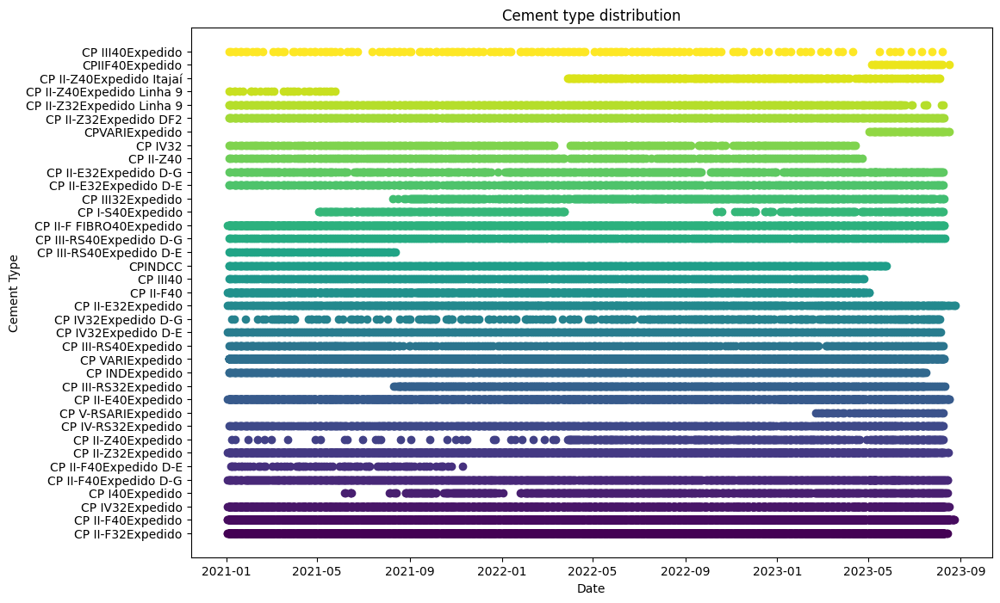

<IPython.core.display.Javascript object>

In [37]:
categories = df["Cement_Type"].unique()
colors = plt.cm.viridis(np.linspace(0, 1, len(categories)))

plt.figure(figsize=(12, 8))

for i, category in enumerate(categories):
    category_data = df[df["Cement_Type"] == category]
    plt.scatter(
        category_data["Date"], [i] * len(category_data), c=colors[i], label=category
    )
plt.yticks(range(len(categories)), categories)
# plt.legend()
plt.xlabel("Date")
plt.ylabel("Cement Type")
plt.title("Cement type distribution")
plt.show()

In [38]:
for cement_type in df["Cement_Type"].unique():
    print(cement_type)

CP II-F32Expedido
CP II-F40Expedido
CP IV32Expedido
CP I40Expedido
CP II-F40Expedido D-G
CP II-F40Expedido D-E
CP II-Z32Expedido
CP II-Z40Expedido
CP IV-RS32Expedido
CP V-RSARIExpedido
CP II-E40Expedido
CP III-RS32Expedido
CP INDExpedido
CP VARIExpedido
CP III-RS40Expedido
CP IV32Expedido D-E
CP IV32Expedido D-G
CP II-E32Expedido
CP II-F40
CP III40
CPINDCC
CP III-RS40Expedido D-E
CP III-RS40Expedido D-G
CP II-F FIBRO40Expedido
CP I-S40Expedido
CP III32Expedido
CP II-E32Expedido D-E
CP II-E32Expedido D-G
CP II-Z40
CP IV32
CPVARIExpedido
CP II-Z32Expedido DF2
CP II-Z32Expedido Linha 9
CP II-Z40Expedido Linha 9
CP II-Z40Expedido Itajaí
CPIIF40Expedido
CP III40Expedido


<IPython.core.display.Javascript object>

In [39]:
df[(df["Cement_Type"] == "CP INDExpedido") | (df["Cement_Type"] == "CPINDCC")].groupby(
    "Cement_Type"
)["CS28"].describe()

,count,mean,std,min,25%,50%,75%,max
Cement_Type,,,,,,,,
CP INDExpedido,649.0,50.536672,2.483802,43.0,48.900002,50.5,52.299999,57.5
CPINDCC,612.0,50.651797,2.462886,43.2,49.100000,50.5,52.300000,57.5


<IPython.core.display.Javascript object>

In [40]:
df[(df["Cement_Type"] == "CP INDExpedido") | (df["Cement_Type"] == "CPINDCC") |
(df["Cement_Type"] == "CP I40Expedido")
  ].groupby("Cement_Type")["CS28"].describe()


,count,mean,std,min,25%,50%,75%,max
Cement_Type,,,,,,,,
CP I40Expedido,508.0,46.844094,1.795992,42.799999,45.400002,46.400002,48.000000,52.200001
CP INDExpedido,649.0,50.536672,2.483802,43.000000,48.900002,50.500000,52.299999,57.500000
CPINDCC,612.0,50.651797,2.462886,43.200000,49.100000,50.500000,52.300000,57.500000


<IPython.core.display.Javascript object>

In [41]:
df["Cement_Type"] = (
    df["Cement_Type"]
    .str.replace("Expedido", "")
    .str.replace("Linha 9", "")
    .str.replace("Itajaí", "")
    .str.replace("D-G", "")
    .str.replace("D-E", "")
    .str.replace("DF2", "")
    .str.replace("CPIIF40", "CP II-F-40")
    .str.replace("CP VARI", "CP V-ARI")
    .str.replace("CPVARI", "CP V-ARI")
    .str.replace("CP V-RSARI", "CP V-ARI RS")
    .str.replace("CP III-RS40", "CP III-40 RS")
    .str.replace("CP III-RS32", "CP III-32 RS")
    .str.replace("CP IV-RS32", "CP IV-32 RS")
    .str.replace("CP III40", "CP III-40")
    .str.replace("CP III32", "CP III-32")
    .str.replace("CP I-S40", "CP I-S-40")
    .str.replace("CP I40", "CP I-40")
    .str.replace("CP II-E32", "CP II-E-32")
    .str.replace("CP II-E40", "CP II-E-40")
    .str.replace("CP II-F FIBRO40", "CP II-F-40")
    .str.replace("CP II-F32", "CP II-F-32")
    .str.replace("CP II-F40", "CP II-F-40")
    .str.replace("CP II-Z32", "CP II-Z-32")
    .str.replace("CP II-Z40", "CP II-Z-40")
    .str.replace("CP IV32", "CP IV-32")
    .str.replace("CP IND", "CP I")
    .str.replace("CPINDCC", "CP I")
    .str.strip()
)

<IPython.core.display.Javascript object>

In [42]:
df["Cement_Type"].value_counts().sort_index()

Cement_Type
CP I            1261
CP I-40          539
CP I-S-40        372
CP II-E-32      1805
CP II-E-40      1813
CP II-F-32      3638
CP II-F-40      7743
CP II-Z-32      3352
CP II-Z-40      1071
CP III-32        511
CP III-32 RS     592
CP III-40        518
CP III-40 RS     863
CP IV-32        3126
CP IV-32 RS      638
CP V-ARI        3213
CP V-ARI RS       54
Name: count, dtype: int64

<IPython.core.display.Javascript object>

/tmp/ipykernel_1800893/3733926260.py:8: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(


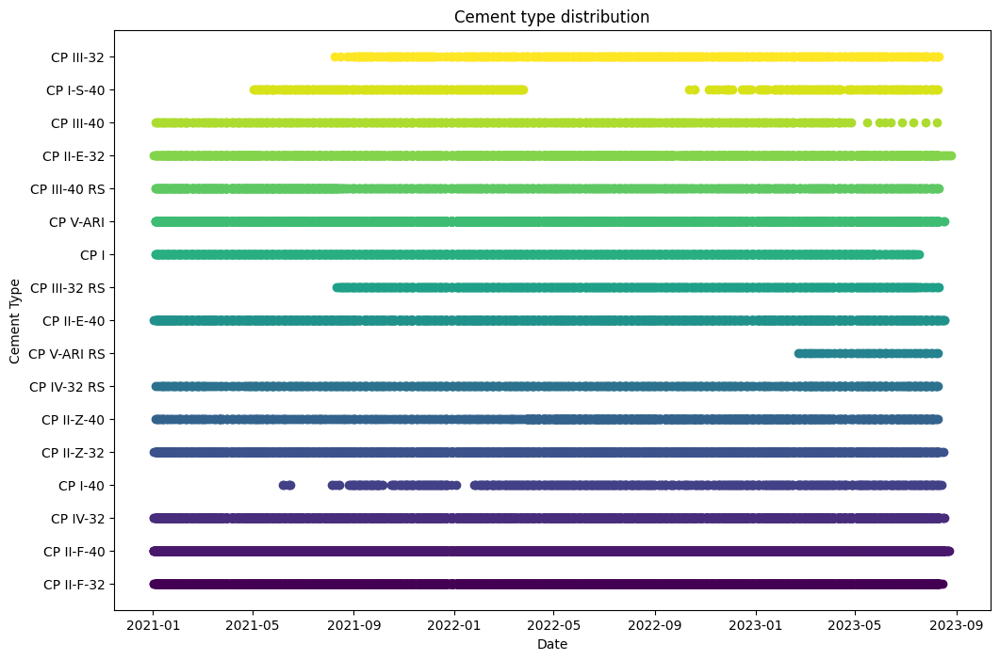

<IPython.core.display.Javascript object>

In [43]:
categories = df["Cement_Type"].unique()
colors = plt.cm.viridis(np.linspace(0, 1, len(categories)))

plt.figure(figsize=(12, 8))

for i, category in enumerate(categories):
    category_data = df[df["Cement_Type"] == category]
    plt.scatter(
        category_data["Date"], [i] * len(category_data), c=colors[i], label=category
    )
plt.yticks(range(len(categories)), categories)
# plt.legend()
plt.xlabel("Date")
plt.ylabel("Cement Type")
plt.title("Cement type distribution")
plt.show()

In [44]:
dates = df["Date"].copy()

<IPython.core.display.Javascript object>

<h2>2. Quality Investigation</h2>

<h3>2.1. Unique values</h3>

<Axes: title={'center': 'Unique Values per feature'}>

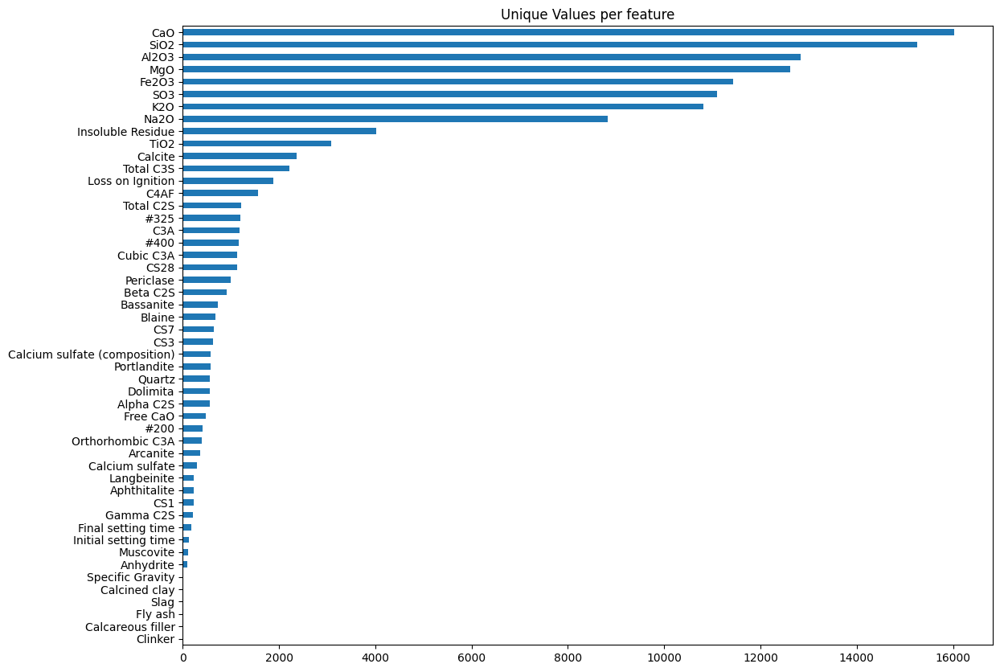

<IPython.core.display.Javascript object>

In [45]:
unique_values = df.select_dtypes(include="number").nunique().sort_values()
unique_values.plot.barh(logy=False, figsize=(13, 10), title="Unique Values per feature")

(array([0, 1, 2, 3]),
 [Text(0, 0, 'Cement_Type'),
  Text(1, 0, 'City'),
  Text(2, 0, 'Plant'),
  Text(3, 0, 'Date')])

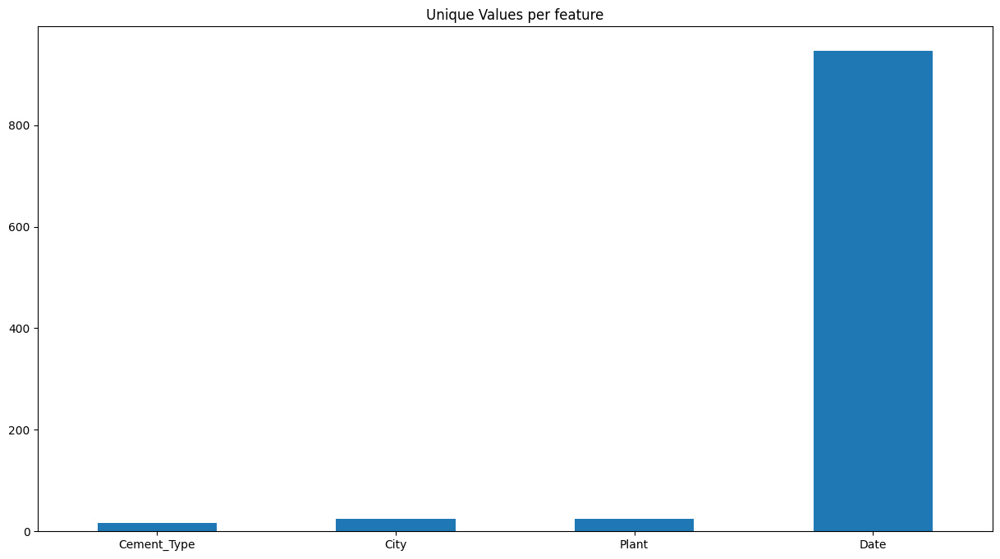

<IPython.core.display.Javascript object>

In [46]:
unique_values = df.select_dtypes(exclude="number").nunique().sort_values()

unique_values.plot.bar(logy=False, figsize=(15, 8), title="Unique Values per feature")

plt.xticks(rotation=0)

(array([0, 1, 2]),
 [Text(0, 0, 'Cement_Type'), Text(1, 0, 'City'), Text(2, 0, 'Plant')])

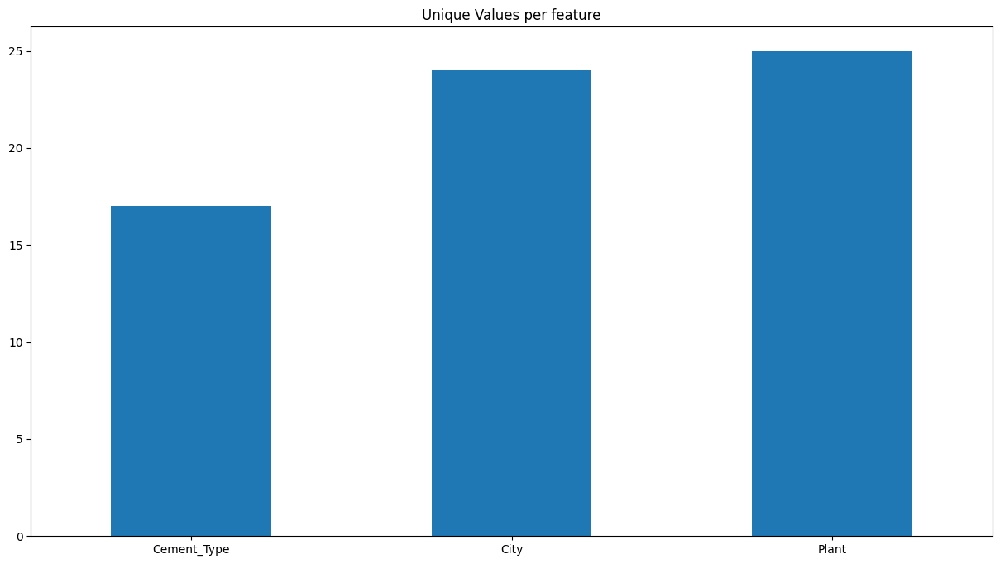

<IPython.core.display.Javascript object>

In [47]:
unique_values = (
    df.select_dtypes(exclude="number").drop("Date", axis=1).nunique().sort_values()
)

unique_values.plot.bar(logy=False, figsize=(15, 8), title="Unique Values per feature")

plt.xticks(rotation=0)

<h3>2.2. Missing values</h3>

In [48]:
print(
    "There are",
    df.isna().any().sum(),
    "variables with missing values from a total of",
    df.shape[1],
)

There are 50 variables with missing values from a total of 54


<IPython.core.display.Javascript object>

In [49]:
df.isna().any()

Plant                            False
City                             False
Date                             False
Clinker                           True
Calcareous filler                 True
Fly ash                           True
Slag                              True
Calcined clay                     True
Calcium sulfate (composition)     True
Total C3S                         True
Total C2S                         True
Alpha C2S                         True
Beta C2S                          True
Gamma C2S                         True
C4AF                              True
C3A                               True
Cubic C3A                         True
Orthorhombic C3A                  True
Free CaO                          True
Portlandite                       True
Periclase                         True
Arcanite                          True
Aphthitalite                      True
Langbeinite                       True
Calcium sulfate                   True
Bassanite                

<IPython.core.display.Javascript object>

In [50]:
df.isna().sum().sort_values(ascending=False).to_frame(
    name="Missing (count)"
).style.background_gradient(cmap="Reds")

,Missing (count)
Specific Gravity,31109
Clinker,31109
Calcareous filler,31109
Fly ash,31109
Slag,31109
Calcined clay,31109
Calcium sulfate,30501
Gamma C2S,29501
Alpha C2S,29501
Beta C2S,29442


<IPython.core.display.Javascript object>

In [51]:
(df.isna().sum() / df.shape[0] * 100).sort_values(ascending=False).to_frame(
    name="Missing (%)"
).style.background_gradient(cmap="Reds")

,Missing (%)
Specific Gravity,100.000000
Clinker,100.000000
Calcareous filler,100.000000
Fly ash,100.000000
Slag,100.000000
Calcined clay,100.000000
Calcium sulfate,98.045582
Gamma C2S,94.831078
Alpha C2S,94.831078
Beta C2S,94.641422


<IPython.core.display.Javascript object>

<BarContainer object of 54 artists>

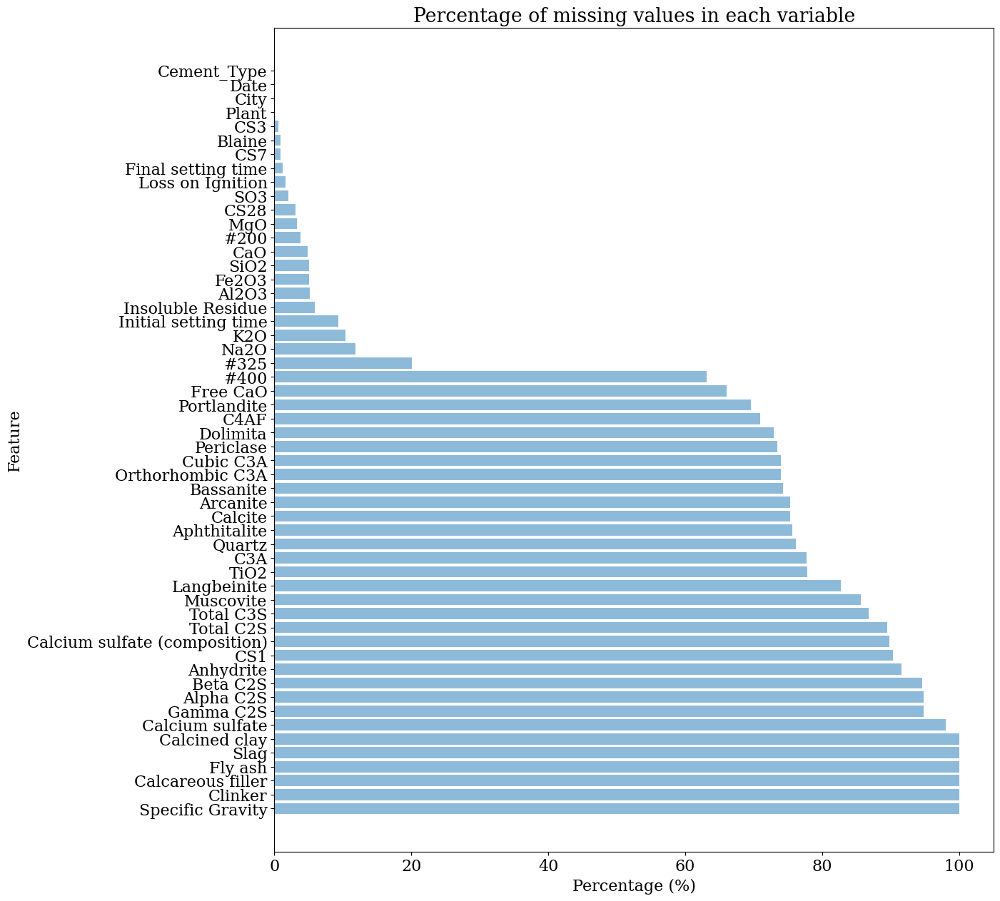

<IPython.core.display.Javascript object>

In [52]:
miss_perc = df.isnull().sum() / df.shape[0] * 100
miss_perc = miss_perc.sort_values(ascending=False)
plt.rc("font", family="serif", size=16)
plt.figure(figsize=(13, 15))
plt.title("Percentage of missing values in each variable")
plt.xlabel("Percentage (%)")
plt.ylabel("Feature")
plt.barh(miss_perc.index, miss_perc.round(2), alpha=0.5)

In [53]:
missing_values = []
for plant, group in df.groupby("Plant"):
    missing_percentages = (group.isna().sum() / group.shape[0]) * 100
    missing_percentages = missing_percentages.sort_values(ascending=False)
    missing_percentages = missing_percentages.to_frame(name=f"Missing (%) for {plant}")
    missing_values.append(missing_percentages.T)

result = pd.concat(missing_values)
result.T.style.background_gradient(cmap="Reds")

,Missing (%) for AA,Missing (%) for AC,Missing (%) for AG,Missing (%) for AI,Missing (%) for AM,Missing (%) for AN,Missing (%) for AP,Missing (%) for AS,Missing (%) for AW,Missing (%) for AX,Missing (%) for AZ,Missing (%) for E,Missing (%) for H,Missing (%) for J,Missing (%) for K,Missing (%) for L,Missing (%) for N,Missing (%) for P,Missing (%) for Q,Missing (%) for S,Missing (%) for U,Missing (%) for V,Missing (%) for W,Missing (%) for X,Missing (%) for Z
Alpha C2S,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,58.355206,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,8.103295,100.000000,92.872416
Beta C2S,100.000000,100.000000,100.000000,100.000000,98.575223,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,58.355206,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,8.103295,100.000000,92.872416
CS1,100.000000,10.296010,100.000000,67.159581,76.068582,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,10.699588,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,89.878831
Clinker,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000
Calcareous filler,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000
Fly ash,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000
Slag,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000
Calcined clay,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000
Anhydrite,100.000000,100.000000,100.000000,100.000000,92.441439,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,58.355206,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,8.103295,100.000000,42.694227
Specific Gravity,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000


<IPython.core.display.Javascript object>

<h3>2.4. Duplicates</h3>

In [54]:
n_duplicates = df.duplicated().sum()
print(f"There are {n_duplicates} duplicates samples.")

There are 13 duplicates samples.


<IPython.core.display.Javascript object>

<h2>3. Content Investigation</h2>

<h3>3.1. Feature distribution</h3>

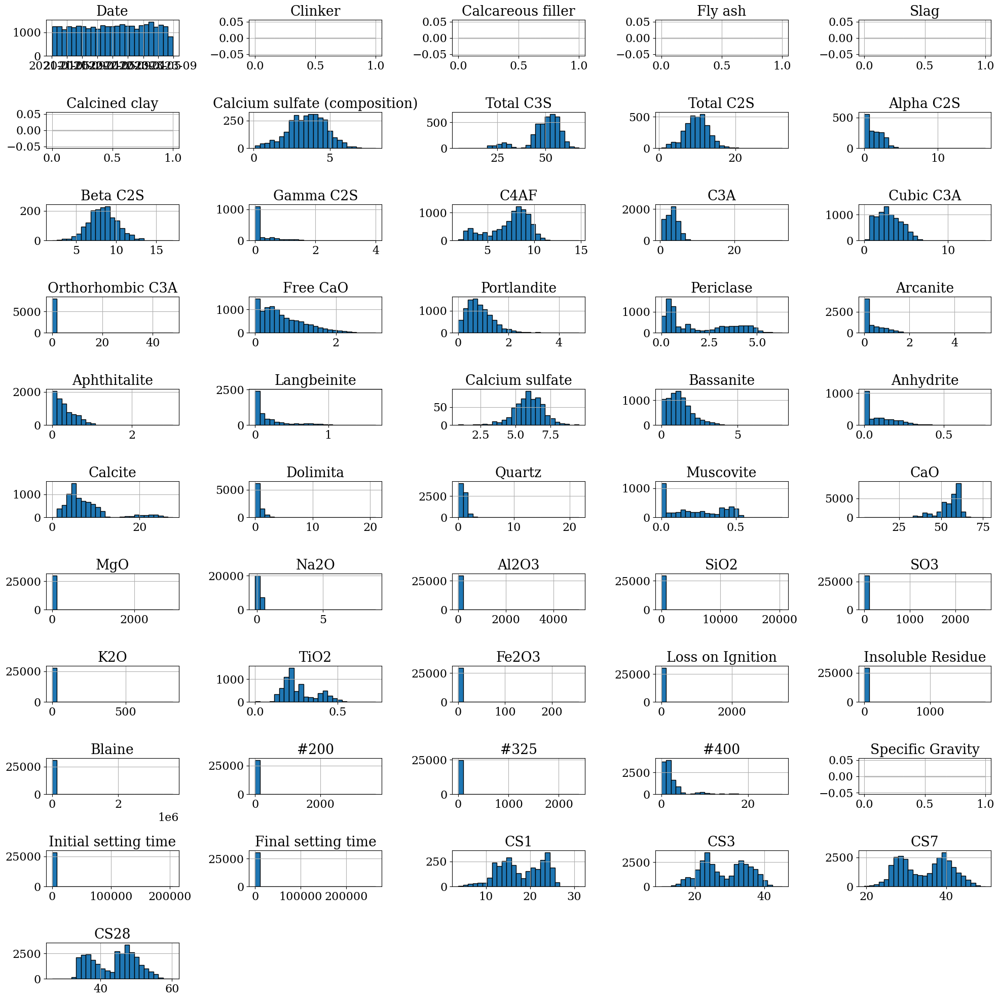

<IPython.core.display.Javascript object>

In [55]:
df.hist(bins=25, figsize=(20, 20), layout=(-1, 5), edgecolor="black")
plt.tight_layout()

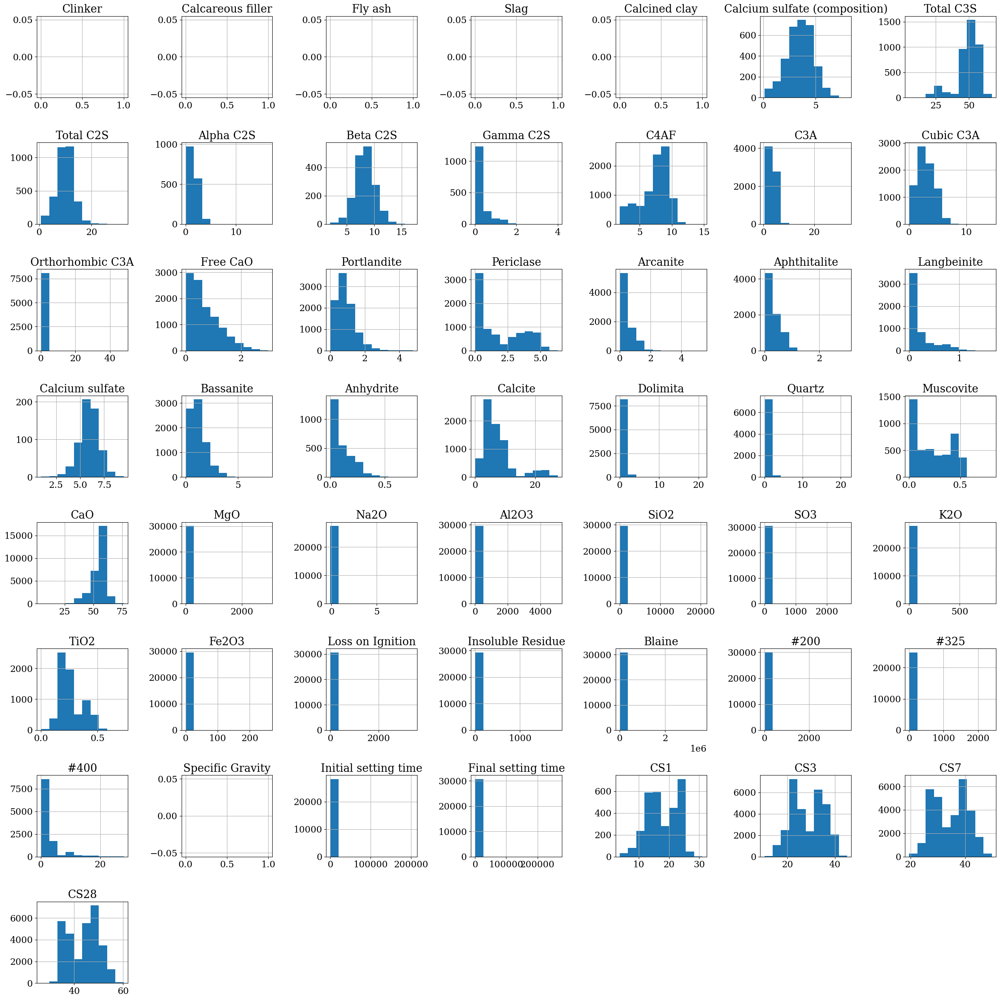

<IPython.core.display.Javascript object>

In [56]:
df.select_dtypes(include="float64").hist(
    figsize=(25, 25),
)
plt.tight_layout()

<h3>Data distribution - KDE plot</h3>

Kdeplot is a Kernel Distribution Estimation Plot which depicts the probability density function of the continuous or non-parametric data variables

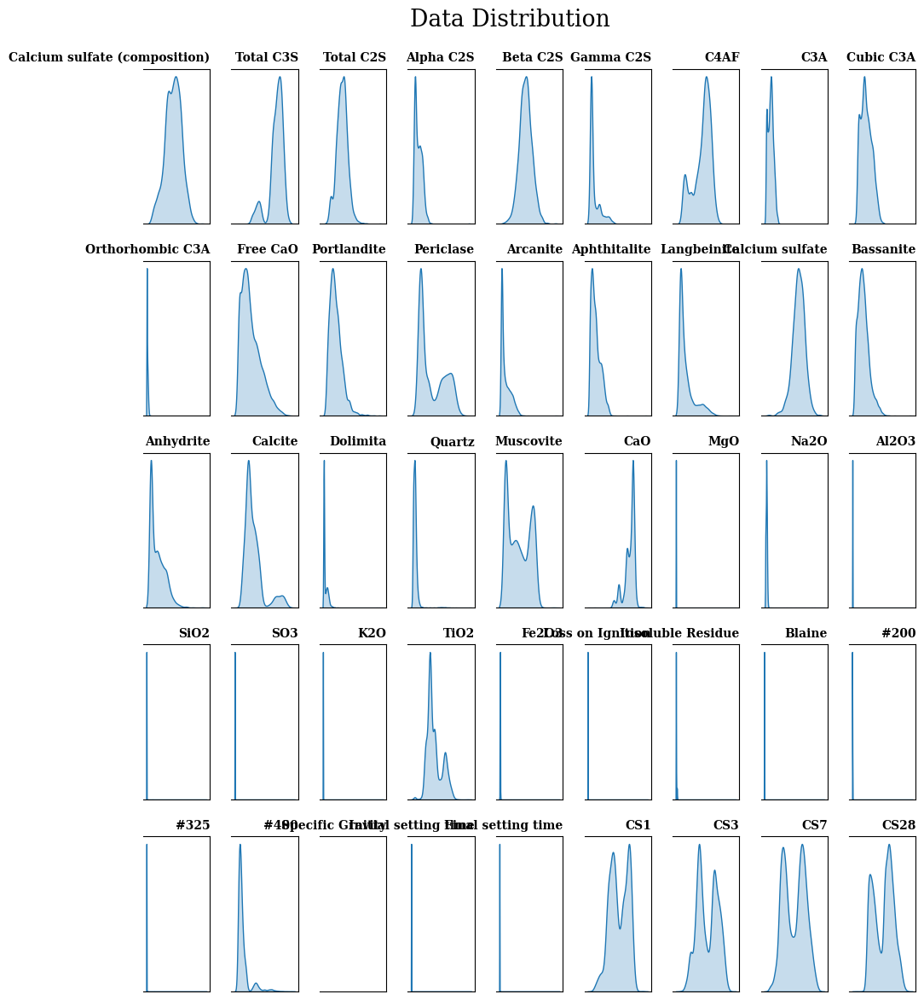

<IPython.core.display.Javascript object>

In [57]:
warnings.filterwarnings("ignore")

fig, axes = plt.subplots(5, 9, figsize=(10, 12))
axes = axes.flatten()
# sns.set_palette(sns.color_palette(["#2a9d8f", "#e9c46a"]))
columns = (
    df.select_dtypes(include="float64")
    .select_dtypes(exclude=object)
    .drop(["Clinker", "Calcareous filler", "Fly ash", "Slag", "Calcined clay"], axis=1)
    .columns
)

for i, ax in enumerate(axes):
    sns.kdeplot(data=df[columns], x=columns[i], ax=ax, palette=["#2a9d8f"], fill=True)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.spines["left"].set_visible(False)
    ax.set_title(columns[i], loc="right", weight="bold", fontsize=10)

# fig.supxlabel('Average (float features)', ha='center', fontweight='bold')
fig.suptitle("Data Distribution")

fig.tight_layout()
plt.show()

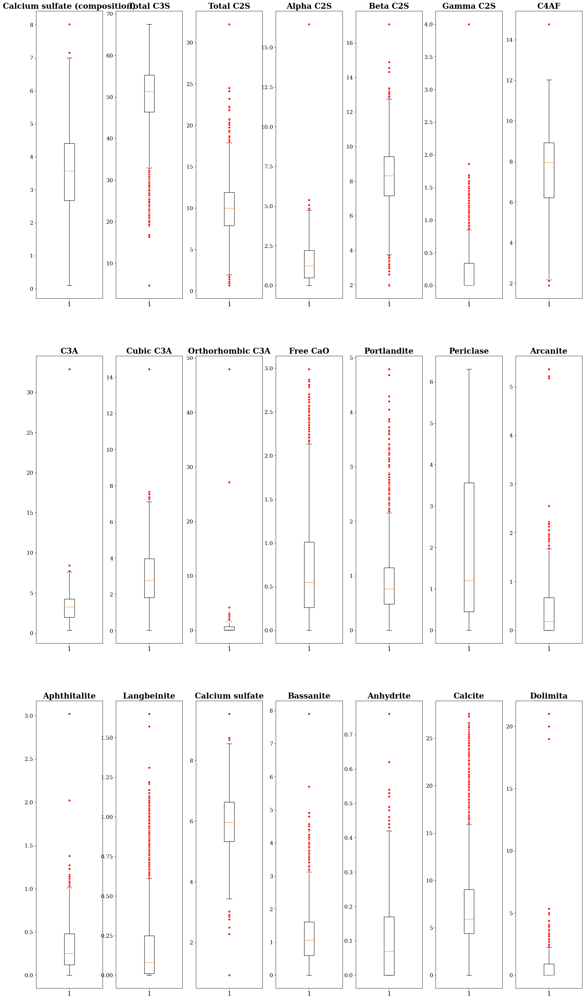

<IPython.core.display.Javascript object>

In [58]:
# Creating subplot of each column with its own scale
float64_columns = (
    df.select_dtypes(include="float64")
    .drop(["Clinker", "Calcareous filler", "Fly ash", "Slag", "Calcined clay"], axis=1)
    .columns
)
df_float64_columns = df[float64_columns]

red_circle = dict(markerfacecolor="red", marker="o", markeredgecolor="white")
fig, axs = plt.subplots(3, 7, figsize=(25, 45))

for i, ax in enumerate(axs.flat):
    ax.boxplot(df_float64_columns.iloc[:, i].dropna(), flierprops=red_circle)
    ax.set_title(df_float64_columns.columns[i], fontsize=20, fontweight="bold")
    ax.tick_params(axis="y", labelsize=14)

<h3>3.3. Feature Relationship</h3>

<h4>3.3.1 Pearson</h4>

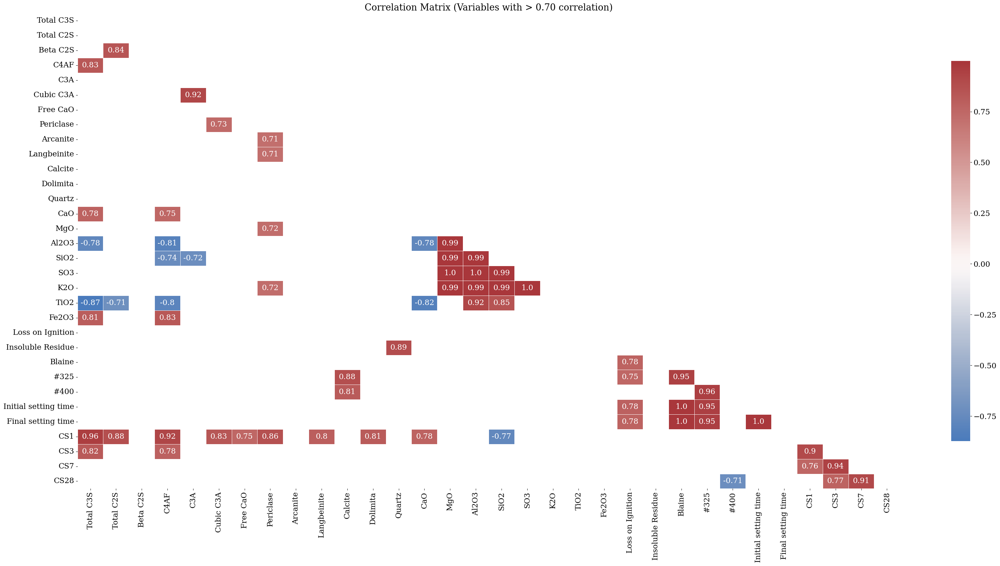

<IPython.core.display.Javascript object>

In [59]:
df_corr = df.drop(["Plant", "Date", "City", "Cement_Type"], axis=1).corr(
    method="pearson"
)


# plt.figure(figsize=(17, 13))
fig, ax = plt.subplots(figsize=(33, 17))

df_corr = df_corr[(abs(df_corr) > 0.70) & (abs(df_corr) < 1)]
df_corr = df_corr.dropna(how="all", axis=1).dropna(how="all", axis=0)
labels = np.where(
    np.abs(df_corr) >= 0.7, np.round(df_corr[np.abs(df_corr) >= 0.70], 2), ""
)

plt.title("Correlation Matrix (Variables with > 0.70 correlation)")
# plt.show()

sns.heatmap(
    df_corr,
    mask=np.triu(np.ones_like(df_corr, dtype=bool)),
    square=False,
    center=0,
    annot=labels,
    fmt="",
    linewidths=0.5,
    cmap="vlag",
    cbar_kws={"shrink": 0.8},
    ax=ax,
)

plt.tight_layout()

In [60]:
corr_matrix = (
    df.drop(["Plant", "Date", "City", "Cement_Type"], axis=1)
    .corr(method="pearson")
    .abs()
)

sol = (
    corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    .stack()
    .sort_values(ascending=False)
)

sol[sol >= 0.70]

Initial setting time  Final setting time      0.999803
Blaine                Final setting time      0.998048
                      Initial setting time    0.997933
Al2O3                 SO3                     0.995677
SO3                   K2O                     0.995521
                                                ...   
Periclase             MgO                     0.715843
#400                  CS28                    0.714039
Periclase             Langbeinite             0.711798
Total C2S             TiO2                    0.711457
Periclase             Arcanite                0.707252
Length: 65, dtype: float64

<IPython.core.display.Javascript object>

In [61]:
sol[sol.index.map(lambda x: "CS28" in x)]

CS7                            CS28    0.907575
CS3                            CS28    0.774516
#400                           CS28    0.714039
Calcite                        CS28    0.639995
CS1                            CS28    0.564566
Langbeinite                    CS28    0.518348
Dolimita                       CS28    0.494910
CaO                            CS28    0.452034
Muscovite                      CS28    0.402919
Aphthitalite                   CS28    0.349665
Free CaO                       CS28    0.318965
Quartz                         CS28    0.318363
Portlandite                    CS28    0.295487
Gamma C2S                      CS28    0.266326
Insoluble Residue              CS28    0.252644
Periclase                      CS28    0.244590
Arcanite                       CS28    0.192943
C4AF                           CS28    0.177630
#325                           CS28    0.170627
Bassanite                      CS28    0.142089
Anhydrite                      CS28    0

<IPython.core.display.Javascript object>

<h4>3.3.2 Spearman</h4>

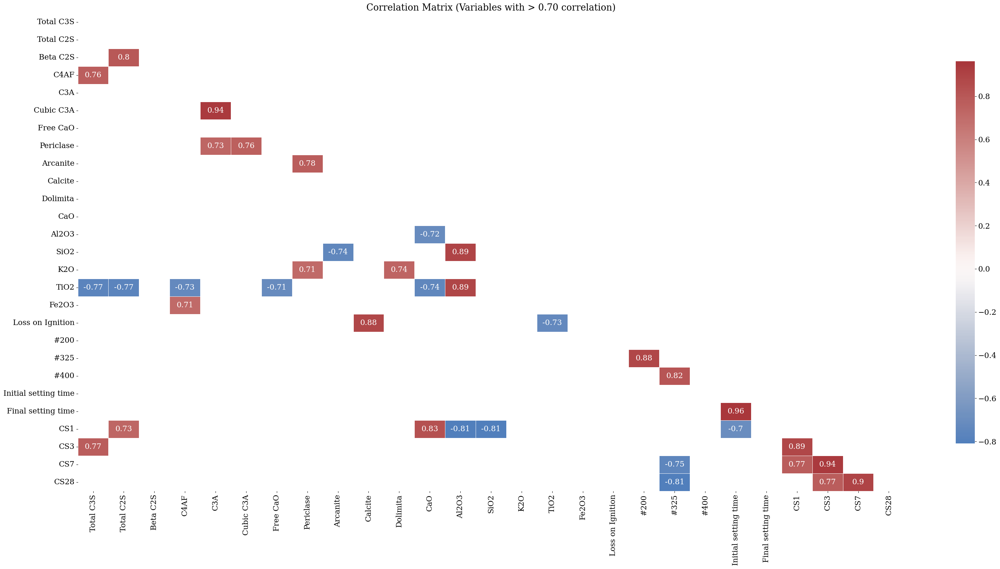

<IPython.core.display.Javascript object>

In [62]:
df_corr = df.drop(["Plant", "Date", "City", "Cement_Type"], axis=1).corr(
    method="spearman"
)


# plt.figure(figsize=(17, 13))
fig, ax = plt.subplots(figsize=(33, 17))

df_corr = df_corr[(abs(df_corr) > 0.70) & (abs(df_corr) < 1)]
df_corr = df_corr.dropna(how="all", axis=1).dropna(how="all", axis=0)
labels = np.where(
    np.abs(df_corr) >= 0.7, np.round(df_corr[np.abs(df_corr) >= 0.70], 2), ""
)

plt.title("Correlation Matrix (Variables with > 0.70 correlation)")
# plt.show()

sns.heatmap(
    df_corr,
    mask=np.triu(np.ones_like(df_corr, dtype=bool)),
    square=False,
    center=0,
    annot=labels,
    fmt="",
    linewidths=0.5,
    cmap="vlag",
    cbar_kws={"shrink": 0.8},
    ax=ax,
)

plt.tight_layout()

In [63]:
corr_matrix = (
    df.drop(["Plant", "Date", "City", "Cement_Type"], axis=1)
    .corr(method="spearman")
    .abs()
)

sol = (
    corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    .stack()
    .sort_values(ascending=False)
)

sol[sol >= 0.70]

Initial setting time  Final setting time    0.962843
C3A                   Cubic C3A             0.940243
CS3                   CS7                   0.936172
CS7                   CS28                  0.896243
Al2O3                 SiO2                  0.894897
                      TiO2                  0.890766
CS1                   CS3                   0.885141
Calcite               Loss on Ignition      0.882749
#200                  #325                  0.881301
CaO                   CS1                   0.833181
#325                  #400                  0.815132
Al2O3                 CS1                   0.809398
SiO2                  CS1                   0.806343
#325                  CS28                  0.805386
Total C2S             Beta C2S              0.802458
Periclase             Arcanite              0.775642
CS3                   CS28                  0.774161
CS1                   CS7                   0.773719
Total C3S             TiO2                  0.

<IPython.core.display.Javascript object>

In [64]:
sol[sol.index.map(lambda x: "CS28" in x)]

CS7                            CS28    0.896243
#325                           CS28    0.805386
CS3                            CS28    0.774161
Insoluble Residue              CS28    0.652679
#200                           CS28    0.638661
CS1                            CS28    0.583192
Dolimita                       CS28    0.573299
#400                           CS28    0.548410
Langbeinite                    CS28    0.533434
Blaine                         CS28    0.517239
SO3                            CS28    0.501720
CaO                            CS28    0.478118
Muscovite                      CS28    0.418357
Loss on Ignition               CS28    0.416896
Quartz                         CS28    0.409841
Initial setting time           CS28    0.393076
Aphthitalite                   CS28    0.392039
Final setting time             CS28    0.384442
Free CaO                       CS28    0.381235
Calcite                        CS28    0.370156
Portlandite                    CS28    0

<IPython.core.display.Javascript object>

<h4>3.3.1 Kendall</h4>

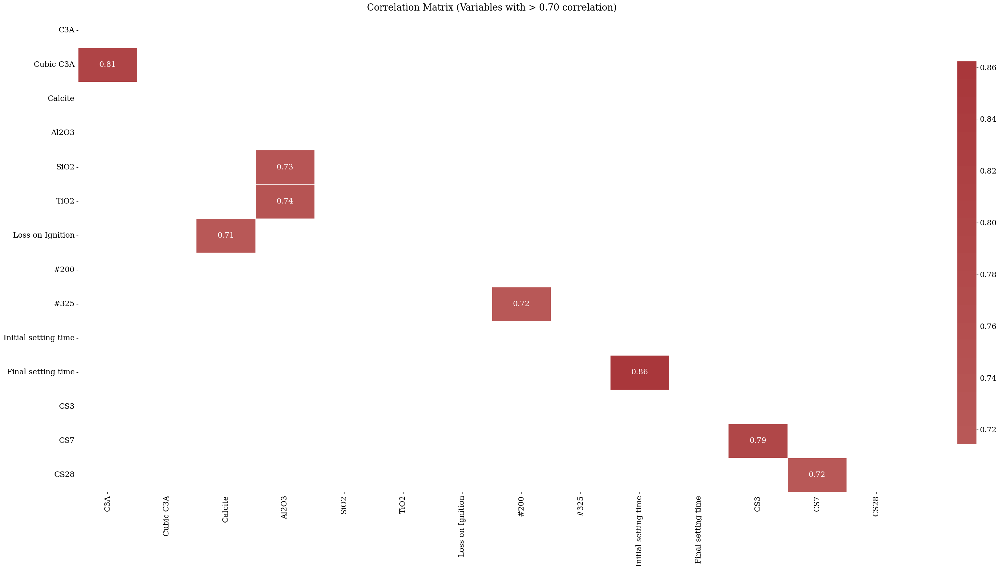

<IPython.core.display.Javascript object>

In [65]:
df_corr = df.drop(["Plant", "Date", "City", "Cement_Type"], axis=1).corr(
    method="kendall"
)


# plt.figure(figsize=(17, 13))
fig, ax = plt.subplots(figsize=(33, 17))

df_corr = df_corr[(abs(df_corr) > 0.70) & (abs(df_corr) < 1)]
df_corr = df_corr.dropna(how="all", axis=1).dropna(how="all", axis=0)
labels = np.where(
    np.abs(df_corr) >= 0.7, np.round(df_corr[np.abs(df_corr) >= 0.70], 2), ""
)

plt.title("Correlation Matrix (Variables with > 0.70 correlation)")
# plt.show()

sns.heatmap(
    df_corr,
    mask=np.triu(np.ones_like(df_corr, dtype=bool)),
    square=False,
    center=0,
    annot=labels,
    fmt="",
    linewidths=0.5,
    cmap="vlag",
    cbar_kws={"shrink": 0.8},
    ax=ax,
)

plt.tight_layout()

In [66]:
corr_matrix = (
    df.drop(["Plant", "Date", "City", "Cement_Type"], axis=1)
    .corr(method="kendall")
    .abs()
)

sol = (
    corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    .stack()
    .sort_values(ascending=False)
)

sol[sol >= 0.70]

Initial setting time  Final setting time    0.862288
C3A                   Cubic C3A             0.805248
CS3                   CS7                   0.793276
Al2O3                 TiO2                  0.739947
                      SiO2                  0.728263
CS7                   CS28                  0.719321
#200                  #325                  0.715464
Calcite               Loss on Ignition      0.714315
dtype: float64

<IPython.core.display.Javascript object>

In [67]:
sol[sol.index.map(lambda x: "CS28" in x)]

CS7                            CS28    0.719321
#325                           CS28    0.610245
CS3                            CS28    0.588410
#200                           CS28    0.475598
Insoluble Residue              CS28    0.454192
CS1                            CS28    0.440453
Dolimita                       CS28    0.429607
#400                           CS28    0.384642
Blaine                         CS28    0.372700
Langbeinite                    CS28    0.366195
SO3                            CS28    0.345377
CaO                            CS28    0.330969
Quartz                         CS28    0.289050
Loss on Ignition               CS28    0.281748
Muscovite                      CS28    0.278495
Aphthitalite                   CS28    0.271770
Initial setting time           CS28    0.268737
Free CaO                       CS28    0.261612
Final setting time             CS28    0.261572
Calcite                        CS28    0.257682
Portlandite                    CS28    0

<IPython.core.display.Javascript object>

#### Bivariate Analysis

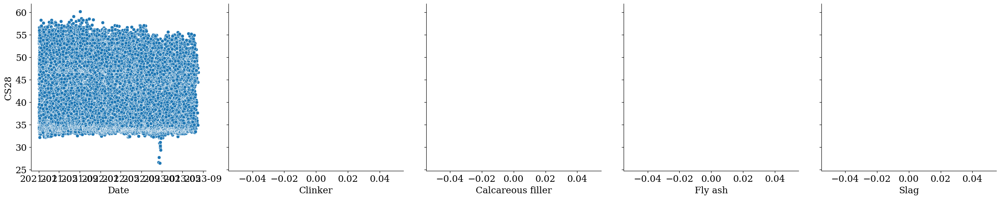

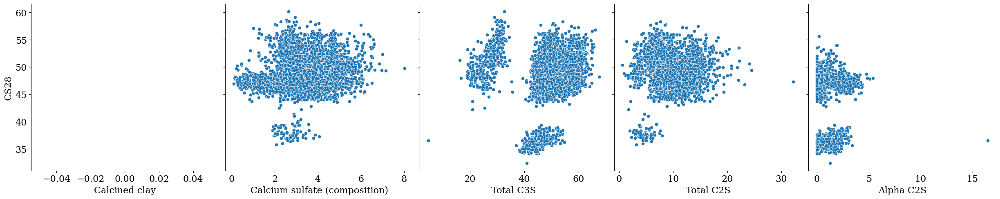

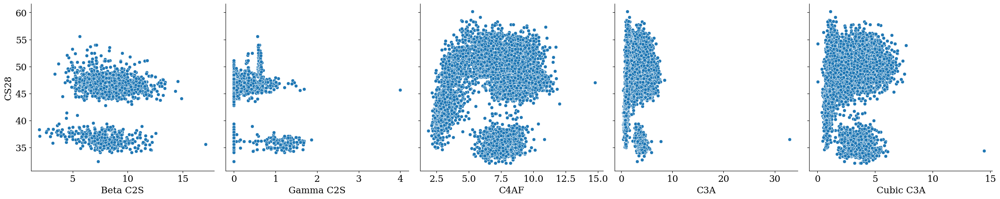

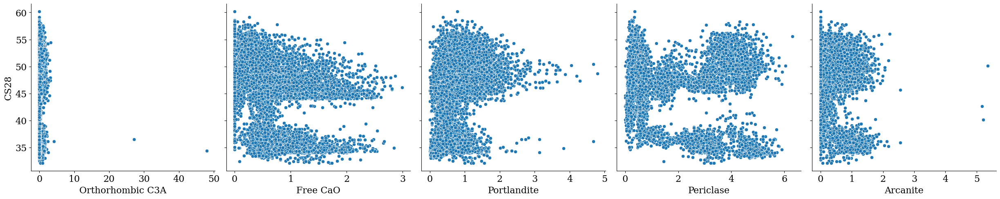

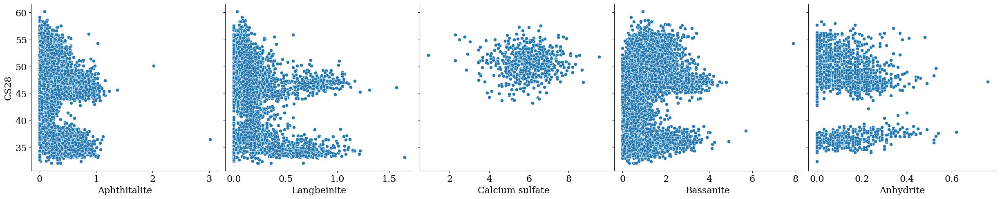

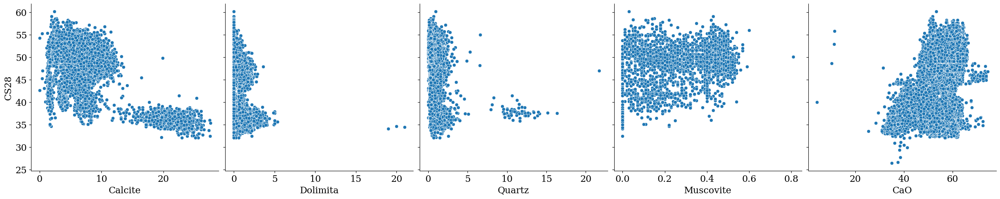

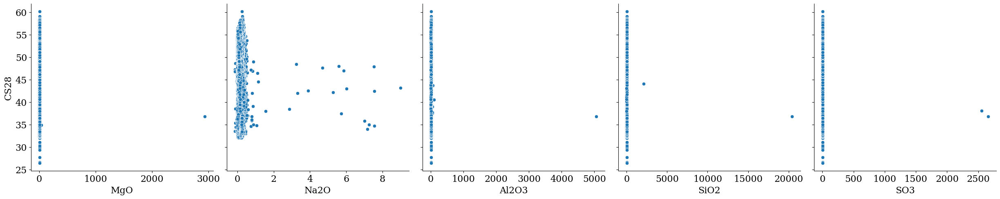

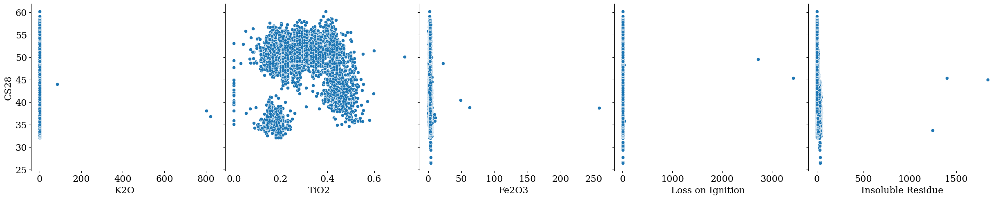

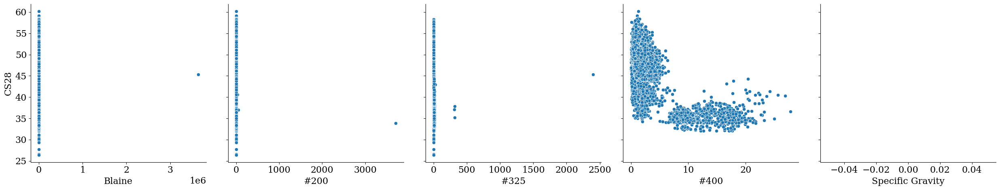

<IPython.core.display.Javascript object>

In [68]:
num_lines = 9
plots_per_line = 5

variables_to_plot = df.select_dtypes(exclude=object).columns.tolist()
variables_to_plot.remove("CS28")

warnings.filterwarnings("ignore")

for n in range(num_lines):
    start_idx = n * plots_per_line
    end_idx = start_idx + plots_per_line

    grid = sns.pairplot(
        df,
        x_vars=variables_to_plot[start_idx:end_idx],
        y_vars=["CS28"],
        diag_kind="kde",
        kind="scatter",
        height=5,
    )

# grid.fig.suptitle(
#     "Bivariate Analysis: Variables vs. 28-day Compressive Strength", y=1.02
# )
plt.tight_layout()
plt.show()

In [69]:
def corrfunc(x, y, ax=None, **kws):
    """Plot the correlation coefficient in the top left hand corner of a plot."""
    r, _ = pearsonr(x, y)
    ax = ax or plt.gca()
    ax.annotate(f"ρ = {r:.2f}", xy=(0.1, 0.9), xycoords=ax.transAxes)
    return None

<IPython.core.display.Javascript object>

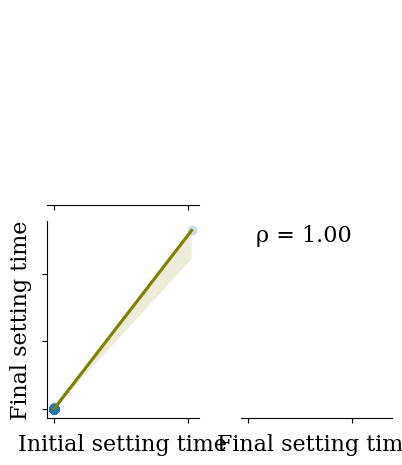

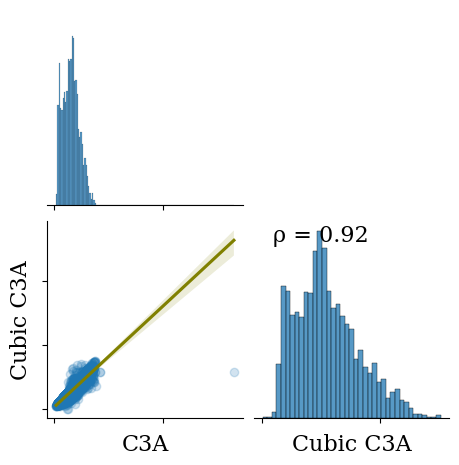

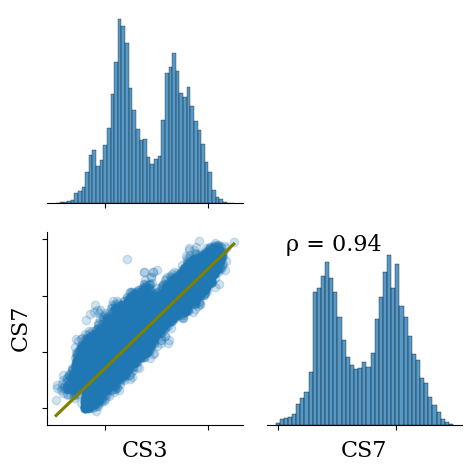

<IPython.core.display.Javascript object>

In [70]:
warnings.filterwarnings("ignore")

for pair in sol[sol > 0.75].index.values:
    if pair[0] != pair[1]:
        data = df[[pair[0], pair[1]]].dropna()
        g = sns.pairplot(
            data,
            corner=True,
            kind="reg",
            plot_kws={"line_kws": {"color": "olive"}, "scatter_kws": {"alpha": 0.2}},
        )
        corrfunc(data[pair[0]], data[pair[1]])
        g.set(xticklabels=[])
        g.set(yticklabels=[])

plt.tight_layout()

### 4. Date/TimeVariable Analyses

In [71]:
# How many days are valid datas e.g not weekends

valid_days = np.count_nonzero(
    np.is_busday(dates.apply(lambda x: x.date()).unique().astype("datetime64"))
)
print(valid_days, "valid days out of", len(dates.apply(lambda x: x.date()).unique()))

688 valid days out of 946


<IPython.core.display.Javascript object>

In [72]:
# What are the years the data was collected?
years = set(map(lambda date: date.year, dates))
print("Years present in the data:", years)

Years present in the data: {2021, 2022, 2023}


<IPython.core.display.Javascript object>

In [73]:
# What are months the data was collected for every year?

months_each_year = {}
for year in years:
    months_each_year[year] = set([date.month for date in dates if date.year == year])

print("Months of data for each year:")
months_each_year

Months of data for each year:


{2021: {1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12},
 2022: {1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12},
 2023: {1, 2, 3, 4, 5, 6, 7, 8}}

<IPython.core.display.Javascript object>

In [74]:
# How many unique days every month has for every year?

year = dates.dt.year
month = dates.dt.month
day = dates.dt.day

# Create a dataframe with the year and month of each date
df_year_month = pd.DataFrame({"Year": year, "Month": month, "Day": day})

# Count the number of dates in each year and month
df_year_month = df_year_month.groupby(["Year", "Month"])["Day"].apply(
    lambda x: len(x.unique())
)

# Give a name to the series
df_year_month.name = "Unique days per month"

# Print the dataframe
print(df_year_month)

Year  Month
2021  1        29
      2        26
      3        31
      4        28
      5        30
      6        30
      7        31
      8        31
      9        30
      10       31
      11       29
      12       29
2022  1        29
      2        28
      3        31
      4        30
      5        31
      6        30
      7        31
      8        31
      9        30
      10       31
      11       30
      12       30
2023  1        29
      2        27
      3        30
      4        28
      5        31
      6        30
      7        31
      8        23
Name: Unique days per month, dtype: int64


<IPython.core.display.Javascript object>

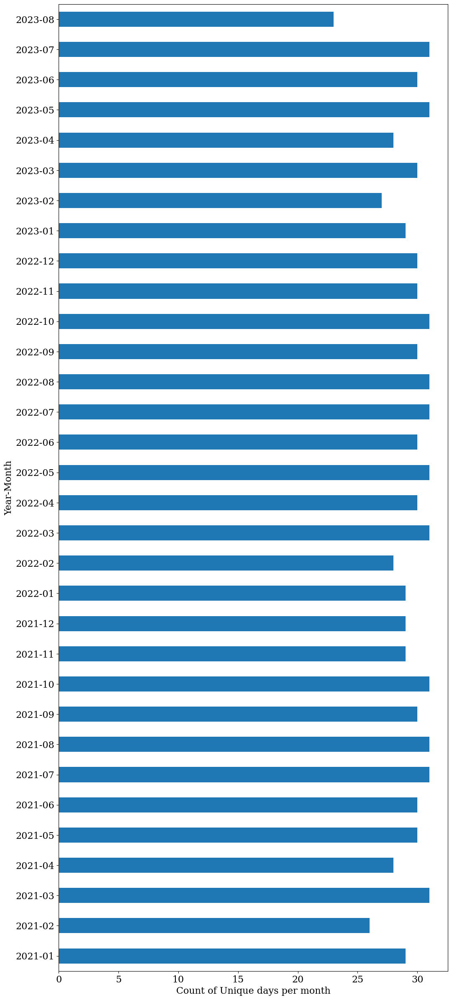

<IPython.core.display.Javascript object>

In [75]:
df_year_month_copy = df_year_month.copy()
df_year_month.index.map(lambda x: f"{x[0]}-{x[1]:02d}"),

df_year_month_copy.index = (
    pd.to_datetime(
        df_year_month.index.map(lambda x: f"{x[0]}-{x[1]:02d}"), format="%Y-%m"
    ).to_period("M")
    # .strftime("%b %Y")
)
df_year_month_copy.index

plt.figure(figsize=(12, 30))
ax = df_year_month_copy.plot(kind="barh")
ax.set_ylabel("Year-Month")
ax.set_xlabel("Count of Unique days per month")
None

In [76]:
# How many data points every month has for every year?

year = dates.dt.year
month = dates.dt.month

# Create a dataframe with the year and month of each date
df_year_month = pd.DataFrame({"Year": year, "Month": month})

# Count the number of dates in each year and month
df_year_month = df_year_month.groupby(["Year", "Month"]).size()

# Give a name to the series
df_year_month.name = "size"

# Print the dataframe
print(df_year_month)

Year  Month
2021  1         940
      2         908
      3        1019
      4         913
      5         981
      6         959
      7        1001
      8         991
      9         977
      10        939
      11        935
      12        961
2022  1         971
      2         966
      3        1012
      4         938
      5        1049
      6        1024
      7        1038
      8        1112
      9         975
      10        946
      11        957
      12        996
2023  1        1097
      2         990
      3        1178
      4         932
      5        1059
      6         987
      7         961
      8         397
Name: size, dtype: int64


<IPython.core.display.Javascript object>

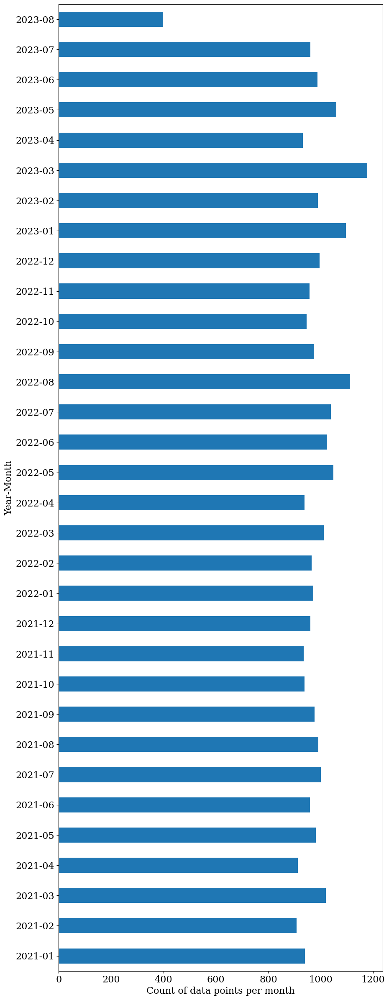

<IPython.core.display.Javascript object>

In [77]:
df_year_month_copy = df_year_month.copy()
df_year_month.index.map(lambda x: f"{x[0]}-{x[1]:02d}"),

df_year_month_copy.index = (
    pd.to_datetime(
        df_year_month.index.map(lambda x: f"{x[0]}-{x[1]:02d}"), format="%Y-%m"
    ).to_period("M")
    # .strftime("%b %Y")
)
df_year_month_copy.index

plt.figure(figsize=(10, 30))
ax = df_year_month_copy.plot(kind="barh")
ax.set_ylabel("Year-Month")
ax.set_xlabel("Count of data points per month")
None

In [78]:
# What is the year-month with the minimum and maximum number of collected data points?

df_reseted = df_year_month.reset_index()
df_reseted["Year_Month"] = (
    df_reseted["Year"].apply(str) + "-" + df_reseted["Month"].apply(str)
)

min_obs_key, min_obs_value = df_reseted[df_reseted["size"] == df_reseted["size"].min()][
    ["Year_Month", "size"]
].values[0]

max_obs_key, max_obs_value = df_reseted[df_reseted["size"] == df_reseted["size"].max()][
    ["Year_Month", "size"]
].values[0]


print(min_obs_key, "has the minimum number of days with samples -", min_obs_value)
print(max_obs_key, "has the maximum number of days with samples -", max_obs_value)

2023-8 has the minimum number of days with samples - 397
2023-3 has the maximum number of days with samples - 1178


<IPython.core.display.Javascript object>

In [79]:
# What is the mean number of observations per year?

mean_obs_per_year = df_year_month.groupby(["Year"]).mean(["size"]).apply(int).to_dict()

print("Mean Number of observations - per year")
print(mean_obs_per_year)
print()
print("Mean number of observations - all years")
print(int(df_year_month.mean()))

Mean Number of observations - per year
{2021: 960, 2022: 998, 2023: 950}

Mean number of observations - all years
972


<IPython.core.display.Javascript object>

In [80]:
# How many times every day reapeats for each year-month?

year = dates.dt.year
month = dates.dt.month
day = dates.dt.day
# Create a dataframe with the year and month of each date
df_year_month = pd.DataFrame({"Year": year, "Month": month, "Day": day})


# Group by year, month, and day, and count occurrences
day_counts = (
    df_year_month.groupby(["Year", "Month", "Day"]).size().reset_index(name="DayCount")
)

day_counts[["DayCount"]].describe()

,DayCount
count,946.000000
mean,32.884778
std,14.709909
min,1.000000
25%,27.000000
50%,39.000000
75%,43.000000
max,60.000000


<IPython.core.display.Javascript object>

In [81]:
day_counts[["DayCount"]].value_counts()

DayCount
41          65
43          65
42          61
44          61
45          52
2           50
40          44
1           38
39          37
38          33
47          28
33          26
3           25
37          25
35          20
26          20
36          20
34          19
32          19
27          18
28          18
29          18
46          17
48          16
30          16
25          14
4           13
24          13
31          11
49          10
50           8
5            8
51           7
22           7
23           5
10           4
9            4
21           4
11           4
52           3
54           2
53           2
12           2
16           2
55           2
6            2
57           1
8            1
7            1
13           1
15           1
17           1
18           1
60           1
Name: count, dtype: int64

<IPython.core.display.Javascript object>

In [82]:
day_counts[day_counts["DayCount"] == day_counts["DayCount"].max()]

,Year,Month,Day,DayCount
867,2023,6,6,60


<IPython.core.display.Javascript object>

### Compressive Strength Distribution

#### 1 Day

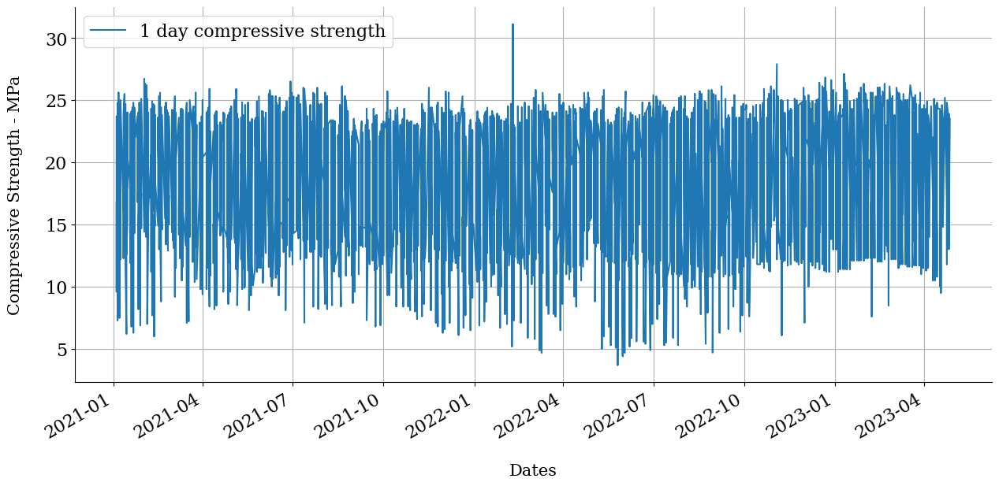

<IPython.core.display.Javascript object>

In [83]:
tmp = df[["Date", "CS1"]].dropna().copy()
tmp = tmp[tmp["Date"].dt.year != 1900].reset_index(drop=True)
tmp = tmp.set_index("Date")

fig, ax = plt.subplots(1, 1, sharex=True, sharey=True, figsize=(15, 7))
tmp.plot(ax=ax)
ax.grid(which="both")
ax.legend(["1 day compressive strength"], loc="upper left")
ax.set_xlabel("Dates", labelpad=20, fontsize=15)
ax.set_ylabel("Compressive Strength - MPa", labelpad=20, fontsize=15)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

plt.show()

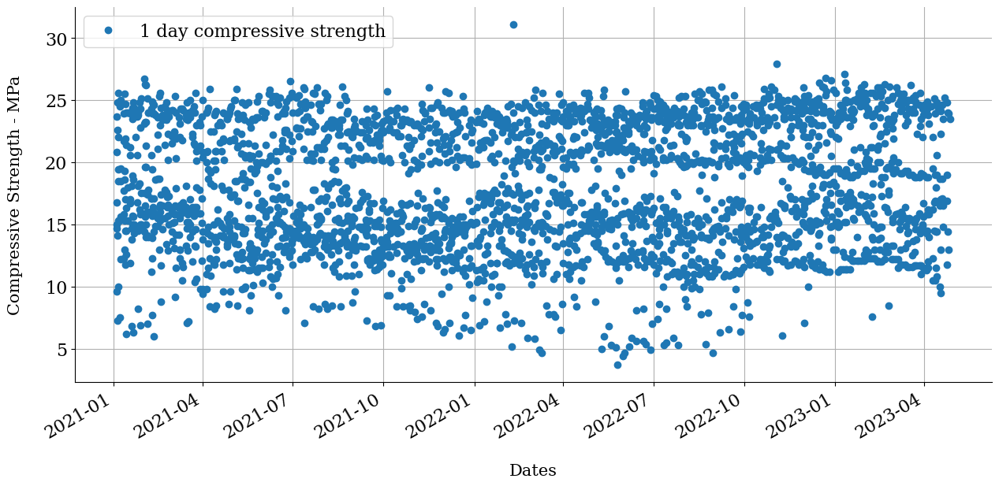

<IPython.core.display.Javascript object>

In [84]:
tmp = df[["Date", "CS1"]].dropna().copy()
tmp = tmp[tmp["Date"].dt.year != 1900].reset_index(drop=True)
tmp = tmp.set_index("Date")

fig, ax = plt.subplots(1, 1, sharex=True, sharey=True, figsize=(15, 7))
tmp.plot(ax=ax, marker="o", linestyle="")
ax.grid(which="both")
ax.legend(["1 day compressive strength"], loc="upper left")
ax.set_xlabel("Dates", labelpad=20, fontsize=15)
ax.set_ylabel("Compressive Strength - MPa", labelpad=20, fontsize=15)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

plt.show()

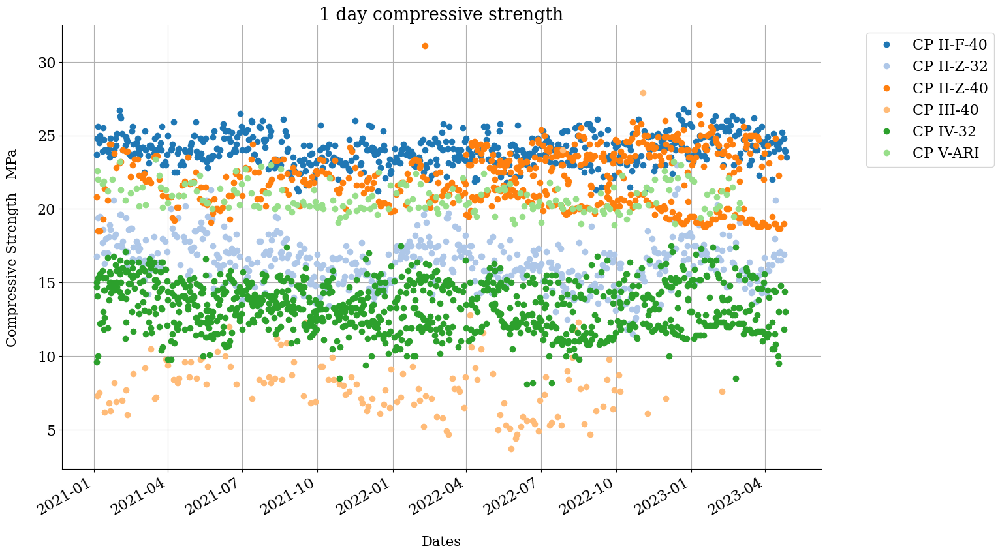

<IPython.core.display.Javascript object>

In [85]:
tmp = df[["Date", "CS1", "Cement_Type"]].dropna().copy()
tmp = tmp[tmp["Date"].dt.year != 1900].reset_index(drop=True)
tmp = tmp.set_index("Date")

fig, ax = plt.subplots(1, 1, sharex=True, sharey=True, figsize=(15, 10))

# Iterate through cement types and plot with unique colors and labels
colors = plt.cm.get_cmap("tab20").colors  # Choose a colormap with enough colors
labels = []  # Empty list to store cement type labels for legend
for i, (cement_type, group_data) in enumerate(tmp.groupby("Cement_Type")):
    labels.append(cement_type)  # Add cement type to labels list
    group_data.plot(ax=ax, marker="o", linestyle="", color=colors[i], label=cement_type)

ax.grid(which="both")
ax.legend(
    # title="1 day compressive strength",
    loc="upper left",
    bbox_to_anchor=(1.05, 1),
    labels=labels,
)  # Update legend with labels list
ax.set_xlabel("Dates", labelpad=20, fontsize=15)
ax.set_ylabel("Compressive Strength - MPa", labelpad=20, fontsize=15)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.set_title("1 day compressive strength")

plt.show()

#### 3 Days

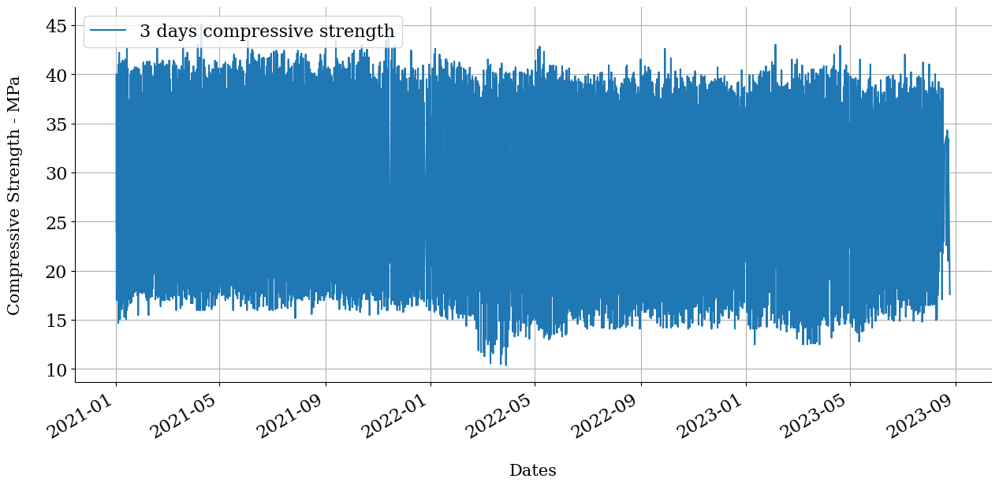

<IPython.core.display.Javascript object>

In [86]:
tmp = df[["Date", "CS3"]].dropna().copy()
tmp = tmp[tmp["Date"].dt.year != 1900].reset_index(drop=True)
tmp = tmp.set_index("Date")

fig, ax = plt.subplots(1, 1, sharex=True, sharey=True, figsize=(15, 7))
tmp.plot(ax=ax)
ax.grid(which="both")
ax.legend(["3 days compressive strength"], loc="upper left")
ax.set_xlabel("Dates", labelpad=20, fontsize=15)
ax.set_ylabel("Compressive Strength - MPa", labelpad=20, fontsize=15)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

plt.show()

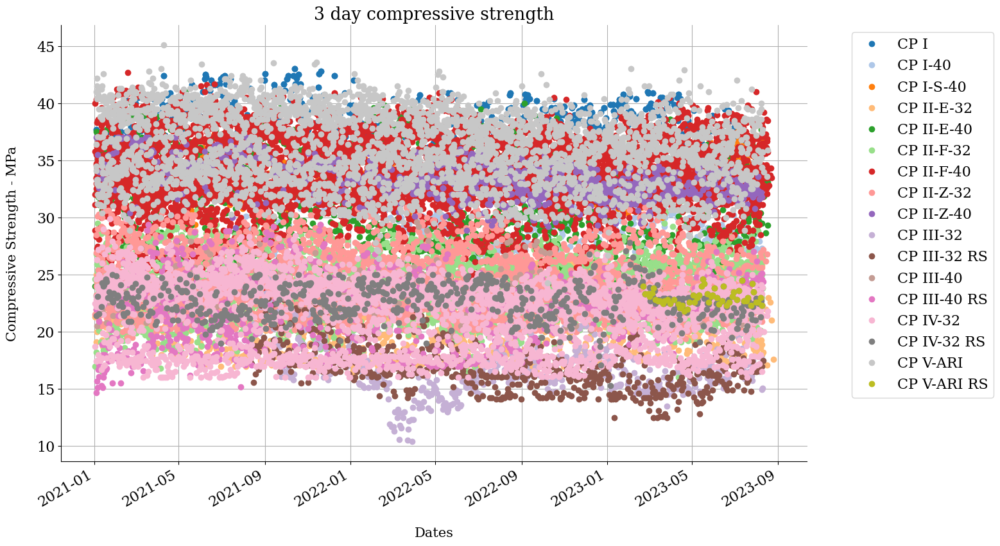

<IPython.core.display.Javascript object>

In [87]:
tmp = df[["Date", "CS3", "Cement_Type"]].dropna().copy()
tmp = tmp[tmp["Date"].dt.year != 1900].reset_index(drop=True)
tmp = tmp.set_index("Date")

fig, ax = plt.subplots(1, 1, sharex=True, sharey=True, figsize=(15, 10))

# Iterate through cement types and plot with unique colors and labels
colors = plt.cm.get_cmap("tab20").colors  # Choose a colormap with enough colors
labels = []  # Empty list to store cement type labels for legend
for i, (cement_type, group_data) in enumerate(tmp.groupby("Cement_Type")):
    labels.append(cement_type)  # Add cement type to labels list
    group_data.plot(ax=ax, marker="o", linestyle="", color=colors[i], label=cement_type)

ax.grid(which="both")
ax.legend(
    # title="1 day compressive strength",
    loc="upper left",
    bbox_to_anchor=(1.05, 1),
    labels=labels,
)  # Update legend with labels list
ax.set_xlabel("Dates", labelpad=20, fontsize=15)
ax.set_ylabel("Compressive Strength - MPa", labelpad=20, fontsize=15)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.set_title("3 day compressive strength")

plt.show()

#### 7 Days

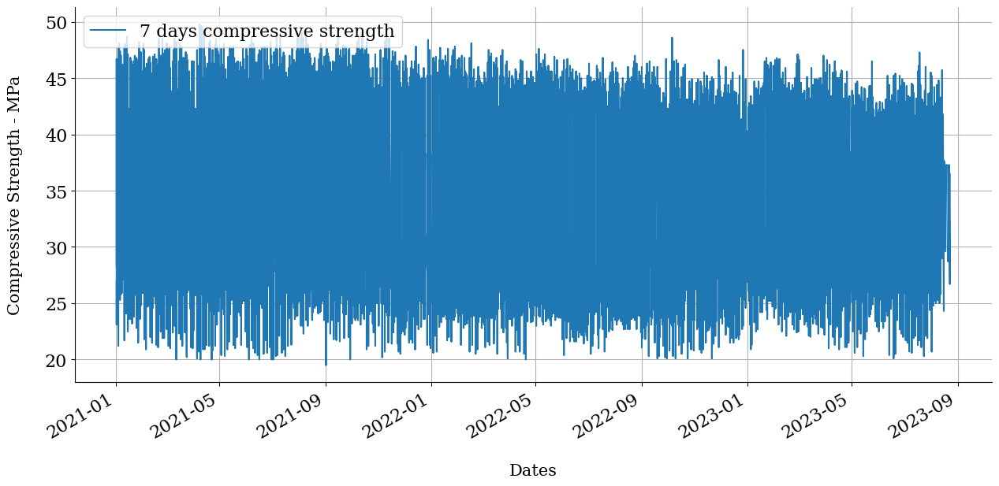

<IPython.core.display.Javascript object>

In [88]:
tmp = df[["Date", "CS7"]].dropna().copy()
tmp = tmp[tmp["CS7"] != 0].reset_index(drop=True)
tmp = tmp[tmp["Date"].dt.year != 1900].reset_index(drop=True)
tmp = tmp.set_index("Date")

fig, ax = plt.subplots(1, 1, sharex=True, sharey=True, figsize=(15, 7))
tmp.plot(ax=ax)
ax.grid(which="both")
ax.legend(["7 days compressive strength"], loc="upper left")
ax.set_xlabel("Dates", labelpad=20, fontsize=15)
ax.set_ylabel("Compressive Strength - MPa", labelpad=20, fontsize=15)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

plt.show()

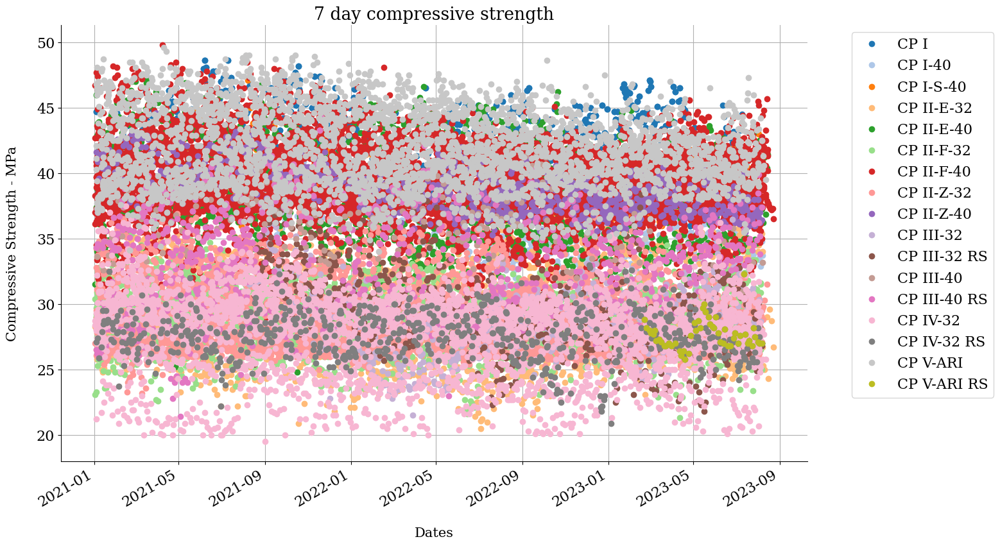

<IPython.core.display.Javascript object>

In [89]:
tmp = df[["Date", "CS7", "Cement_Type"]].dropna().copy()
tmp = tmp[tmp["Date"].dt.year != 1900].reset_index(drop=True)
tmp = tmp.set_index("Date")

fig, ax = plt.subplots(1, 1, sharex=True, sharey=True, figsize=(15, 10))

# Iterate through cement types and plot with unique colors and labels
colors = plt.cm.get_cmap("tab20").colors  # Choose a colormap with enough colors
labels = []  # Empty list to store cement type labels for legend
for i, (cement_type, group_data) in enumerate(tmp.groupby("Cement_Type")):
    labels.append(cement_type)  # Add cement type to labels list
    group_data.plot(ax=ax, marker="o", linestyle="", color=colors[i], label=cement_type)

ax.grid(which="both")
ax.legend(
    # title="1 day compressive strength",
    loc="upper left",
    bbox_to_anchor=(1.05, 1),
    labels=labels,
)  # Update legend with labels list
ax.set_xlabel("Dates", labelpad=20, fontsize=15)
ax.set_ylabel("Compressive Strength - MPa", labelpad=20, fontsize=15)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.set_title("7 day compressive strength")

plt.show()

#### 28 Days

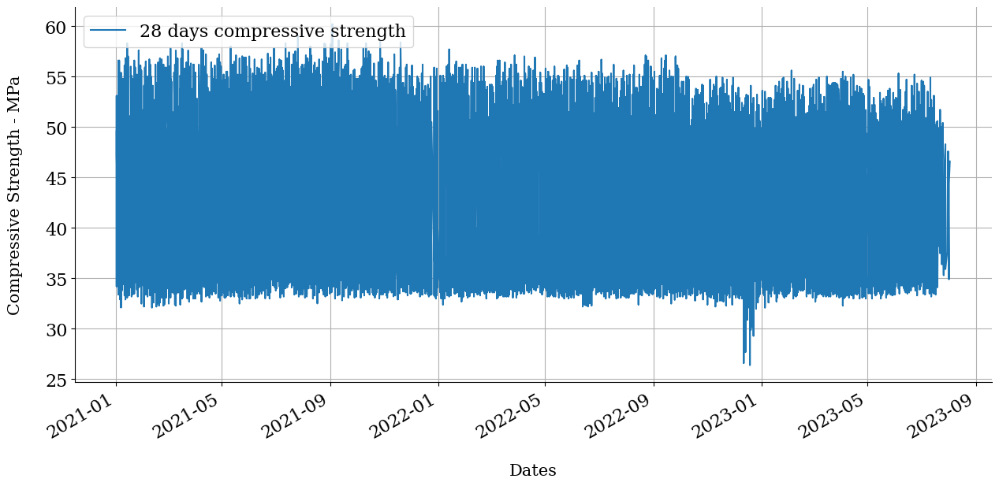

<IPython.core.display.Javascript object>

In [90]:
tmp = df[["Date", "CS28"]].dropna().copy()
tmp = tmp[tmp["CS28"] != 0].reset_index(drop=True)
tmp = tmp[tmp["Date"].dt.year != 1900].reset_index(drop=True)
tmp = tmp.set_index("Date")

fig, ax = plt.subplots(1, 1, sharex=True, sharey=True, figsize=(15, 7))
tmp.plot(ax=ax)
ax.grid(which="both")
ax.legend(["28 days compressive strength"], loc="upper left")
ax.set_xlabel("Dates", labelpad=20, fontsize=15)
ax.set_ylabel("Compressive Strength - MPa", labelpad=20, fontsize=15)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

plt.show()

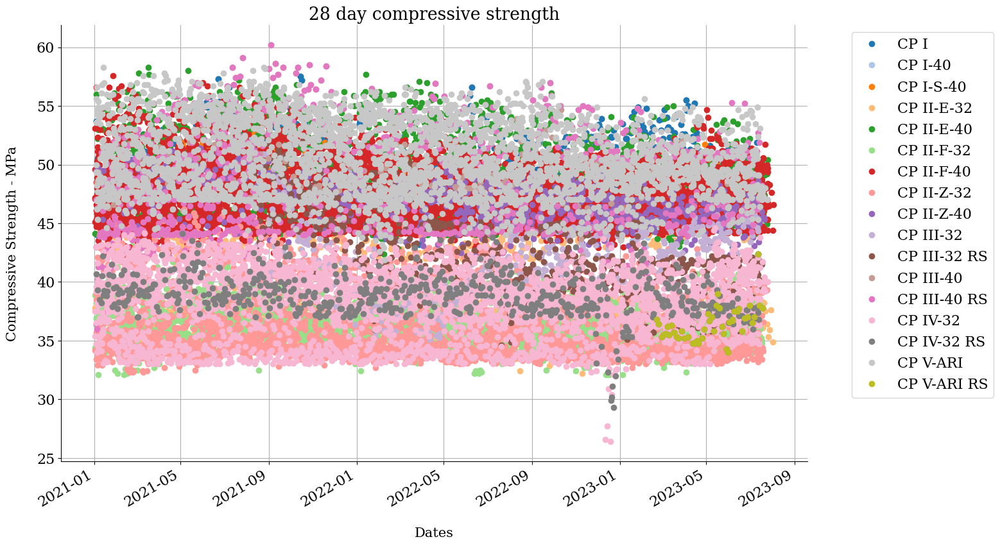

<IPython.core.display.Javascript object>

In [91]:
tmp = df[["Date", "CS28", "Cement_Type"]].dropna().copy()
tmp = tmp[tmp["CS28"] != 0].reset_index(drop=True)
tmp = tmp[tmp["Date"].dt.year != 1900].reset_index(drop=True)
tmp = tmp.set_index("Date")

fig, ax = plt.subplots(1, 1, sharex=True, sharey=True, figsize=(15, 10))

# Iterate through cement types and plot with unique colors and labels
colors = plt.cm.get_cmap("tab20").colors  # Choose a colormap with enough colors
labels = []  # Empty list to store cement type labels for legend
for i, (cement_type, group_data) in enumerate(tmp.groupby("Cement_Type")):
    labels.append(cement_type)  # Add cement type to labels list
    group_data.plot(ax=ax, marker="o", linestyle="", color=colors[i], label=cement_type)

ax.grid(which="both")
ax.legend(
    # title="1 day compressive strength",
    loc="upper left",
    bbox_to_anchor=(1.05, 1),
    labels=labels,
)  # Update legend with labels list
ax.set_xlabel("Dates", labelpad=20, fontsize=15)
ax.set_ylabel("Compressive Strength - MPa", labelpad=20, fontsize=15)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.set_title("28 day compressive strength")

plt.show()